## Given a system of differential Equations...
## Find the ideal damper given a frequency range
### Program designed to solve the second order non homogenous differential equation

A differential equation for θ (for θ small enough so that
sin θ ∼ θ is a good approximation) in this scenario is
given by
## $y''+c/(mL^2)*y'+g/L*y+k/mL*y=T_0/(mL^2)*sin(bt)$
In a Rolls-Royce Trent 900 Series engine, used on Airbus
A380s, we know that
(a) the dry weight m of the engine is 6,246 kg,
(b) the distance L from the wing to the center of mass
is 5.48 m, and
(c) the damping coefficient is c = 104 N·m·s .

The design concern is that vibrations from the operation of the plane will result in practical
resonance, or large sympathetic vibrations, in the engine support. Specifically, vibrations
of the engine will produce torques on the engine support at a frequency of 9,000-12,000 RPM.
You have been assigned the task of choosing the stiffener for the engine support, which
essentially lets you choose the value of k in the model. You can choose among 6 stiffeners,
with k = 2, 3, 4, 5, 6 or 7 (1010 N)/m (1010 N). The goal is to minimize the amplitude
of the steady-state vibrations/swings of the engine, given the frequencies of the
applied vibrations from the engine.


In [1]:
# Import the required modules
import numpy as np
import matplotlib.pyplot as plt
# This makes the plots appear inside the notebook
%matplotlib inline
from scipy.integrate import odeint

Second-order ordinary differential equations
Suppose we have a second-order ODE such as a damped simple harmonic motion equation,

Second order ODE, non homogenous solver, with input

### This assumes y(0) =0 and y'(0) = 0

## Solving with input to test code

Enter A value 2
Enter B value 3
Enter C value 4
Enter f value 5
Enter x range 15


The amplitude is: 0.30163603851606247


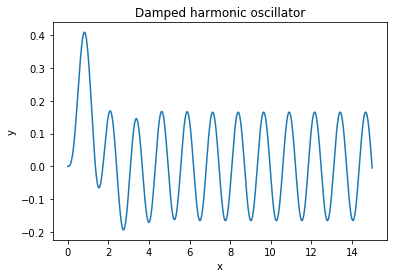

In [2]:
##### print("y'' +A*y'+By = C*sin(b*t)\n\n")
A = float(input("Enter A value "))
#print(type(A))
B = float(input("Enter B value "))
C = float(input("Enter C value "))

f = float(input("Enter f value "))
Xrange = float(input("Enter x range "))

#print("\n Equation the form of\n y'' +"+str(A)+"y' +"+str(B)+ "y = "+str(C)+"*sin(" +str(f)+ "*t)")


def dU_dx(U, x):
    # Here U is a vector such that y=U[0] and z=U[1]. This function should return [y', z']
    #print(U)
    #print(x)
    #form y'' = -A*y'-B*y+D*sin(bx)
    return [U[1], -A*U[1] -B*U[0] + C*np.sin(f*x)]



U0 = [0, 0]
xs = np.linspace(0, Xrange, 1000)
#print(dU_dx(U0,xs))
Us = odeint(dU_dx, U0, xs)
ys = Us[:,0]

amp = (max(ys)+abs(min(ys)))/2
print("\n\nThe amplitude is: "+str(amp))
plt.xlabel("x")
plt.ylabel("y")
plt.title("Damped harmonic oscillator")
plt.plot(xs,ys);


 Equation the form of
 y'' +0.05331346421558484y' +[ 584317.3579488   876475.1418502  1168632.92575161 1460790.70965301
 1752948.49355441 2045106.27745582]y = 5.331346421558483e-06*sin([942.4777960769379, 1256.6370614359173]*t)


A 0.05331346421558484 B[0] 584317.3579487953 C 5.331346421558483e-06 b[0] 942.4777960769379




The Max amplitude is: 1.6404177252707326e-11


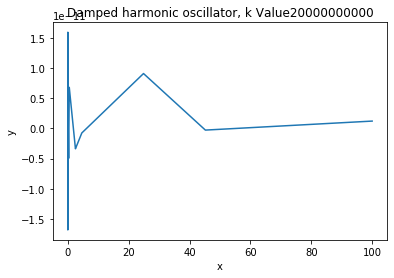

In [3]:
#declare k as the range of k's
k = [2*10**10,3*10**10,4*10**10,5*10**10,6*10**10,7*10**10]
#print(k)

#hard code the values given
mass = 6246.00
L = 5.48
c = 10.0**4
g = 9.81

# upper and lower bound of freq
f_lower = 300*np.pi
f_higher = 400*np.pi

#guess a value of initial torque
T_0 = 1.00

#calculate coeff, A,B,C ect...
A = c/(mass*L**2)

B = np.zeros(len(k))
for i in range(len(k)):
    B[i] = (g/L+k[i]/(mass*L))
#print(B)

C = T_0/(mass*L**2)

b = [f_lower,f_higher]



print("\n Equation the form of\n y'' +"+str(A)+"y' +"+str(B)+ "y = "+str(C)+"*sin(" +str(b)+ "*t)")

def func(U, x, A, B, C, b):
    # Here U is a vector such that y=U[0] and z=U[1]. This function should return [y', z']
    #print(U)
    #print(x)
    #form y'' = -A*y'-B*y+D*sin(bx)
    return [U[1], -A*U[1] -B*U[0] + C*np.sin(b*x)]

U0 = [0, 0]
xs = np.linspace(0, 100, 100000)
print("\n\nA "+str(A)+" B[0] "+str(B[0])+" C "+str(C)+" b[0] "+str(b[0])+"\n\n")

Us = odeint(func,U0,xs, args = (A,B[0],C,b[0]))
ys = Us[:,0]

amp = (max(ys)+abs(min(ys)))/2
print("\n\nThe Max amplitude is: "+str(amp))
plt.xlabel("x")
plt.ylabel("y")
plt.title("Damped harmonic oscillator, k Value"+str(k[0]))
plt.plot(xs,ys);
plt.show()

## now need to define our situation
the 2nd order DE

$y''+c/(mL^2)*y'+g/L*y+k/mL*y=T_0/(mL^2)*sin(bt)$

# Testing with $T_0 = 1000$


 Equation the form of
 y'' +0.05331346421558484y' +[ 584317.3579488   876475.1418502  1168632.92575161 1460790.70965301
 1752948.49355441 2045106.27745582]y = 0.005331346421558483*sin([942.4777960769379, 1256.6370614359173]*t)


A 0.05331346421558484 B[0] 584317.3579487953 C 0.005331346421558483 b[0] 942.4777960769379




The Max amplitude is: 2.8701451374658625e-08


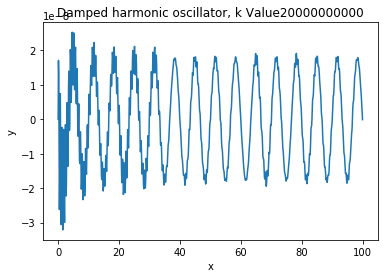

In [4]:


#guess a value of initial torque
T_0 = 1000.00


C = T_0/(mass*L**2)

print("\n Equation the form of\n y'' +"+str(A)+"y' +"+str(B)+ "y = "+str(C)+"*sin(" +str(b)+ "*t)")

def func(U, x, A, B, C, b):
    # Here U is a vector such that y=U[0] and z=U[1]. This function should return [y', z']
    #print(U)
    #print(x)
    #form y'' = -A*y'-B*y+D*sin(bx)
    return [U[1], -A*U[1] -B*U[0] + C*np.sin(b*x)]

U0 = [0, 0]
xs = np.linspace(0, 100, 1000)
print("\n\nA "+str(A)+" B[0] "+str(B[0])+" C "+str(C)+" b[0] "+str(b[0])+"\n\n")

Us = odeint(func,U0,xs, args = (A,B[0],C,b[0]))
ys = Us[:,0]

amp = (max(ys)+abs(min(ys)))/2
print("\n\nThe Max amplitude is: "+str(amp))
plt.xlabel("x")
plt.ylabel("y")
plt.title("Damped harmonic oscillator, k Value"+str(k[0]))
plt.plot(xs,ys);
plt.show()




The amplitude of the plot below is: 2.8701451374658625e-08


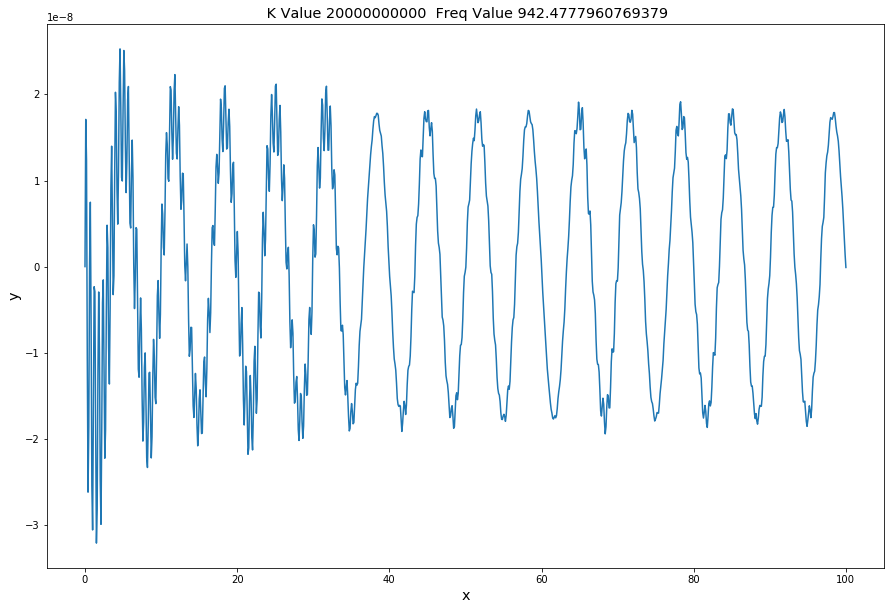



The amplitude of the plot below is: 2.149395702986778e-08


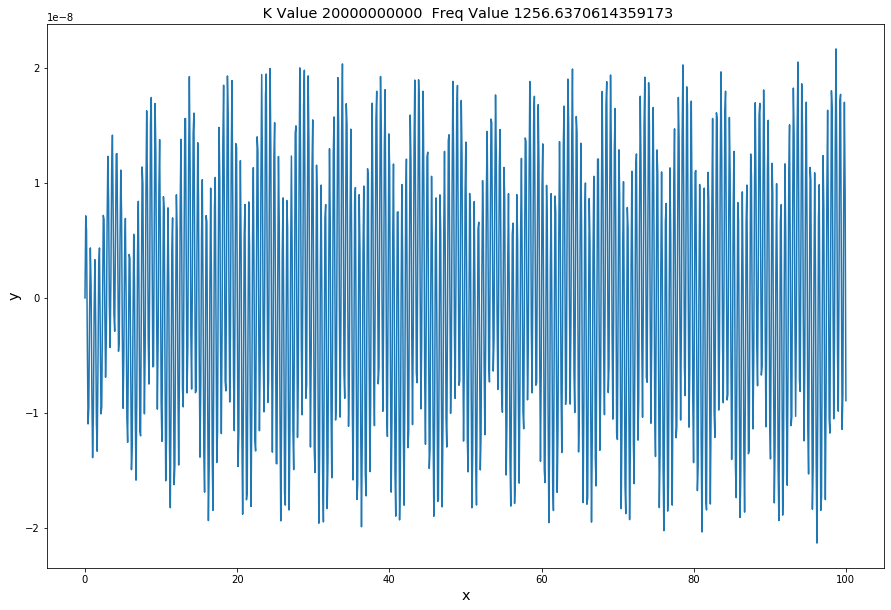



The amplitude of the plot below is: 7.71923995944293e-07


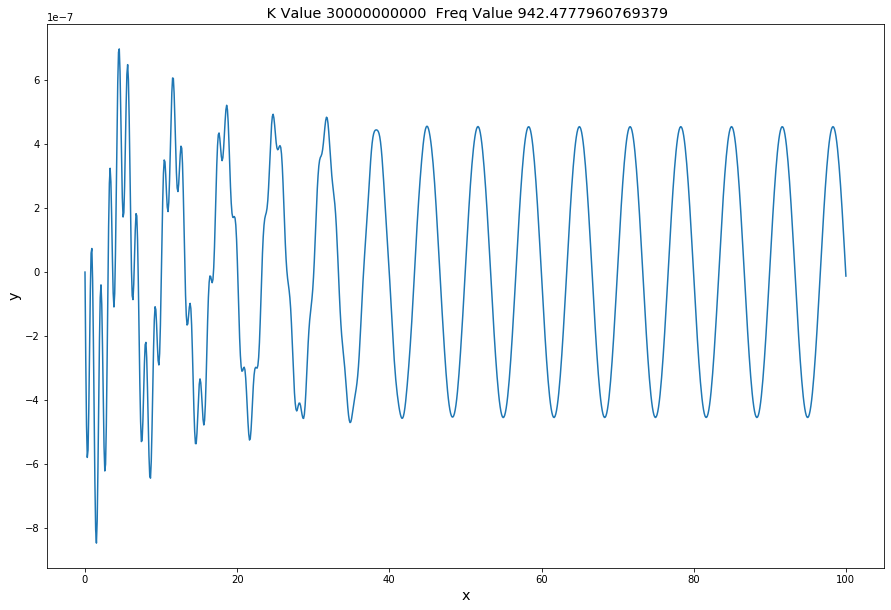



The amplitude of the plot below is: 1.1951306769677874e-08


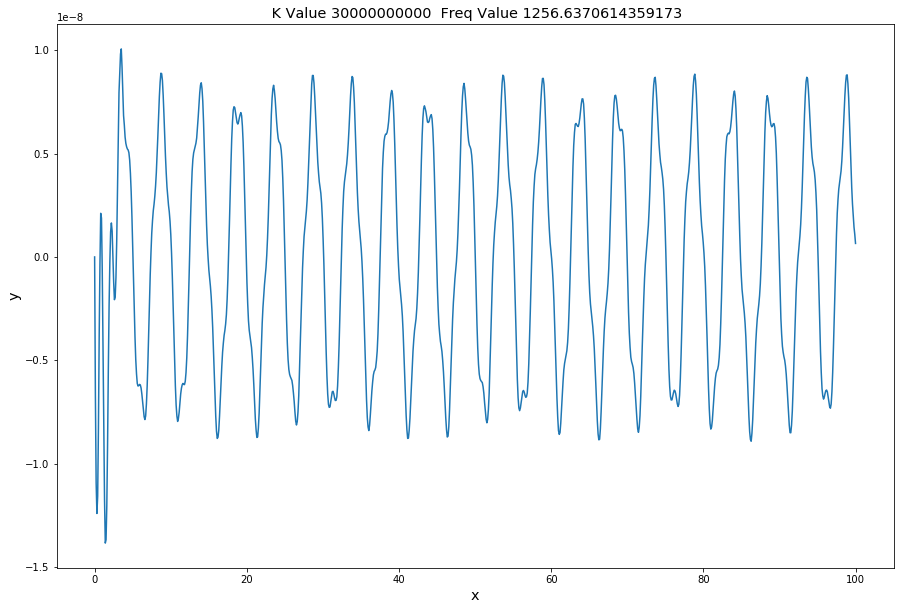



The amplitude of the plot below is: 2.147822743276485e-08


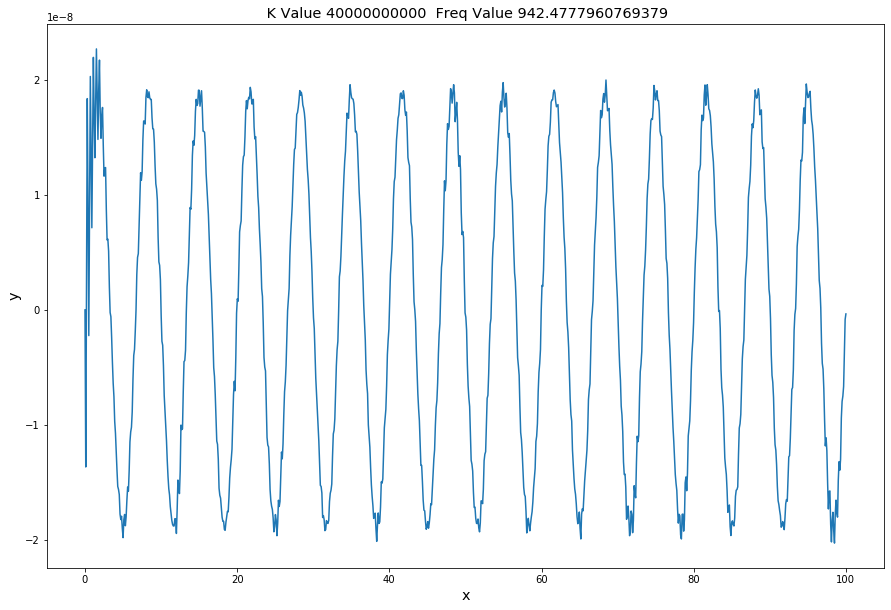



The amplitude of the plot below is: 1.8915245447371376e-08


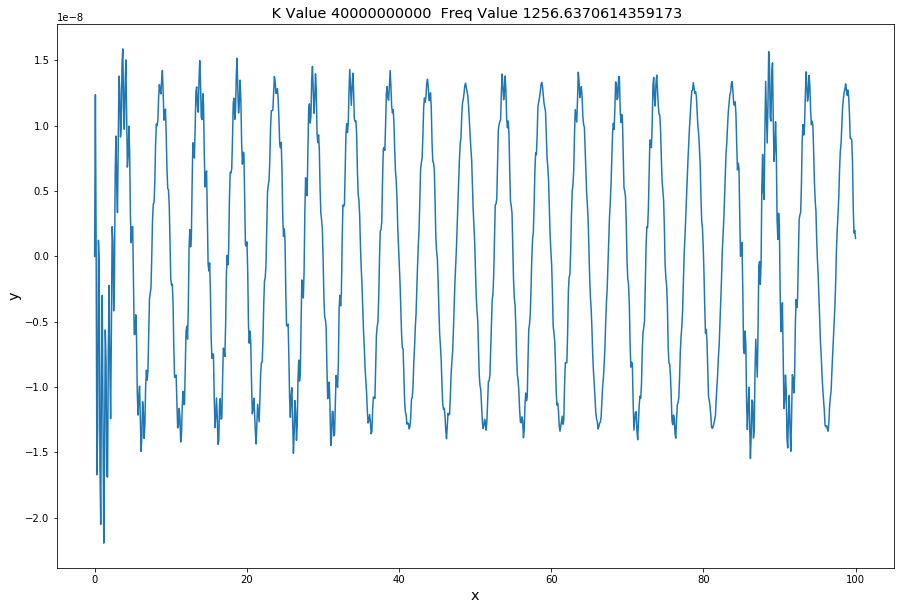



The amplitude of the plot below is: 1.1424523329908138e-08


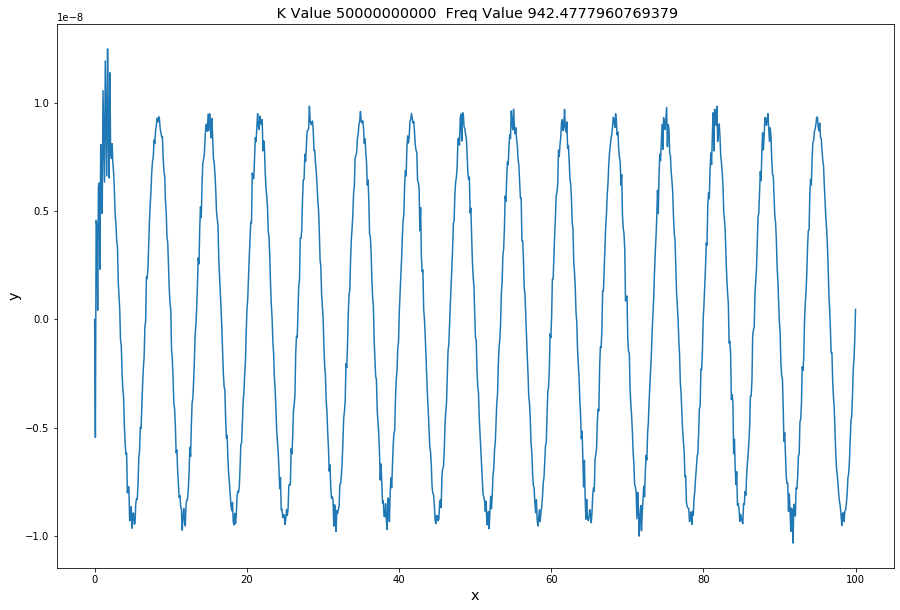



The amplitude of the plot below is: 6.20165769091241e-08


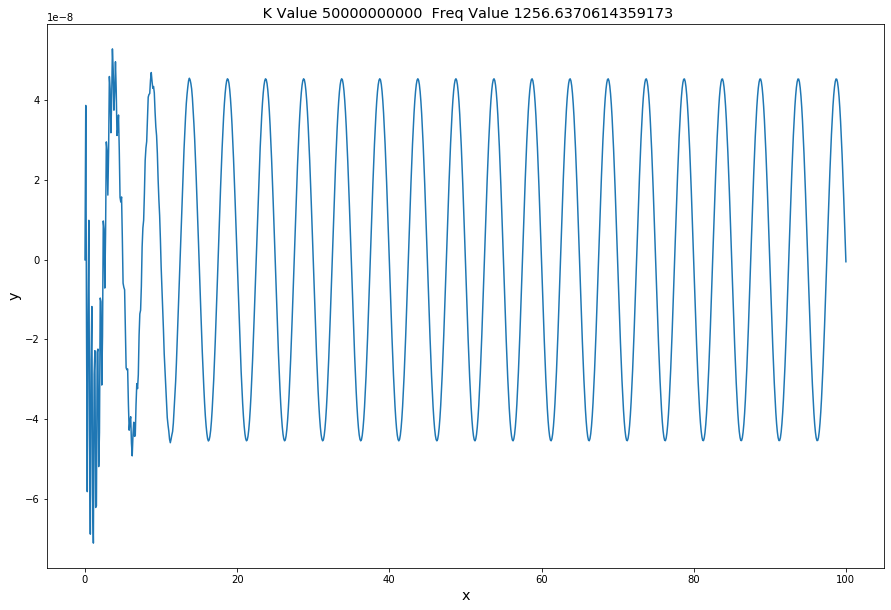



The amplitude of the plot below is: 8.967228961458473e-09


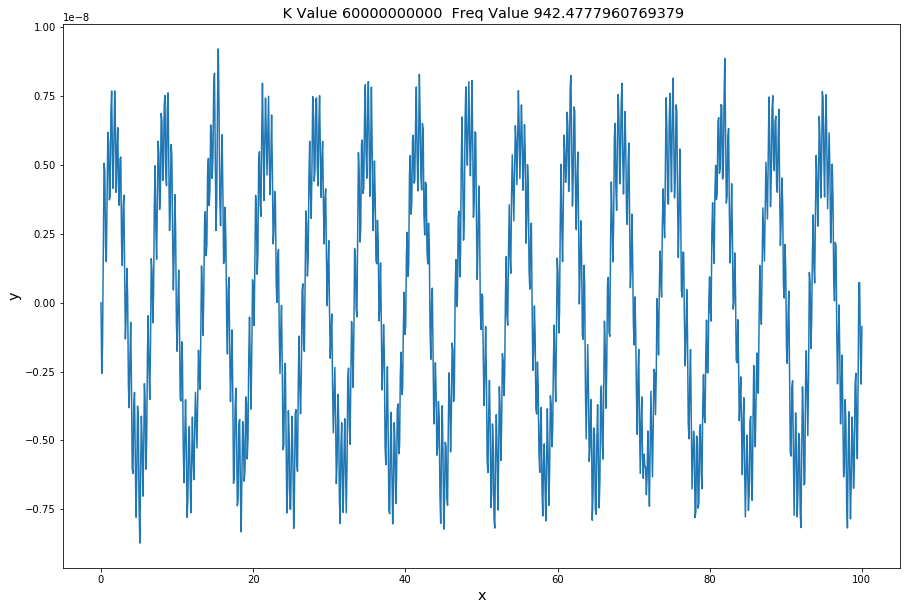



The amplitude of the plot below is: 3.549453872710512e-08


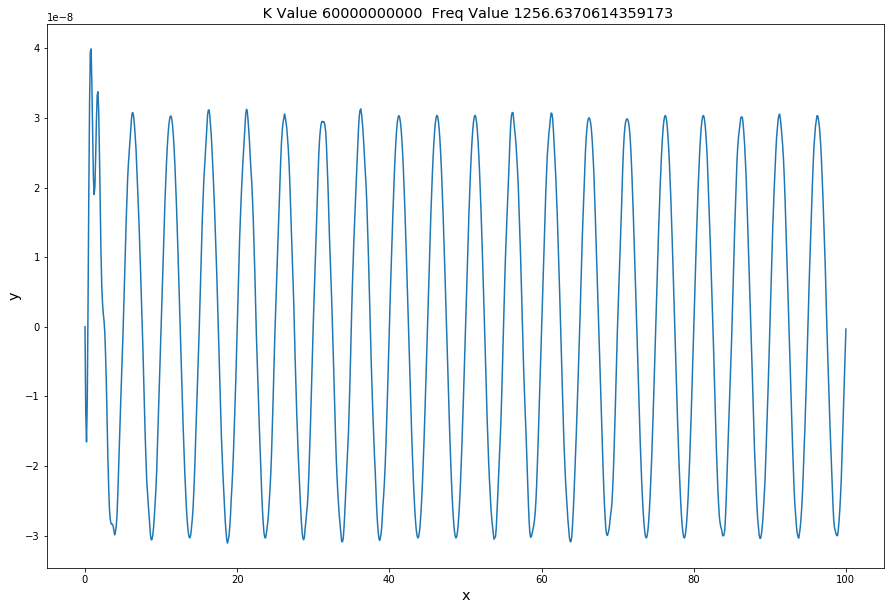



The amplitude of the plot below is: 6.94146433804044e-09


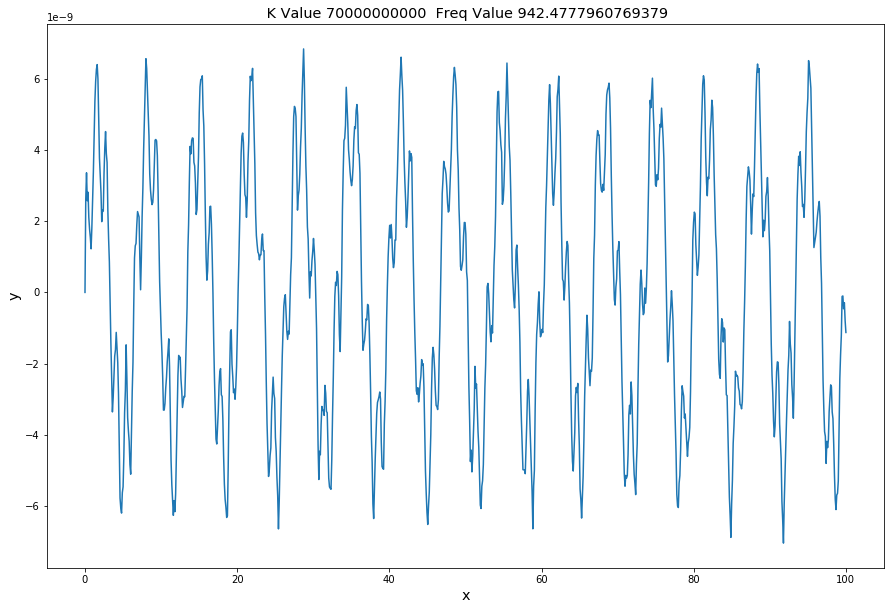



The amplitude of the plot below is: 1.270199266367891e-08


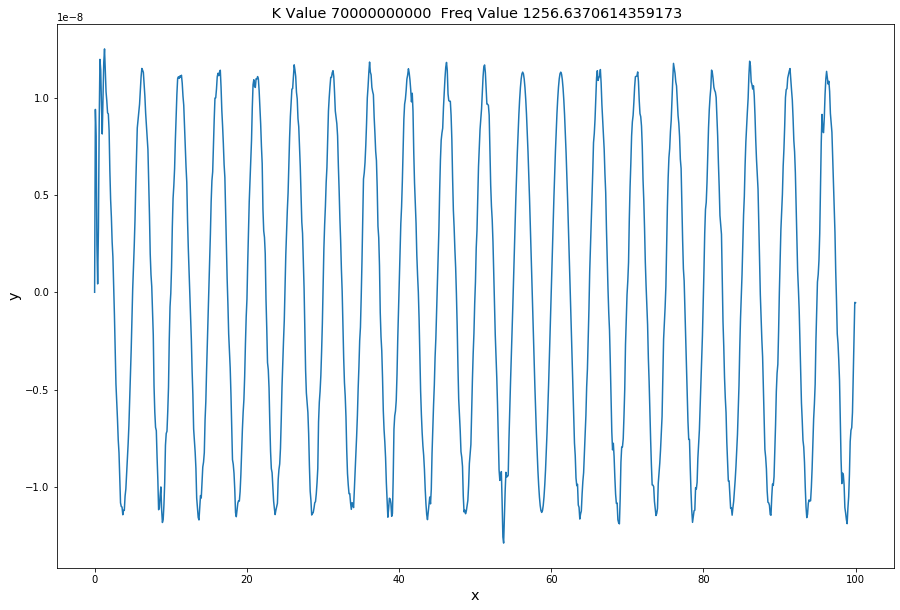

In [5]:
T_0  = 1000.0

#print(type(mass))

C = T_0/(mass*(L**2))

amp = {}
AmpArray = np.zeros(12)
counter = 0
for i in range(len(k)):
    U0 = [0, 0]
    xs = np.linspace(0, 100, 1000)
    amp[i]={}
    for j in range(2):
        counter+=1
        Us = odeint(func,U0,xs, args = (A,B[i],C,b[j]))
        ys = Us[:,0]

        amp[i][j] = (max(ys)+abs(min(ys)))/2
        AmpArray[counter-1]= amp[i][j]
        print("\n\nThe amplitude of the plot below is: "+str(amp[i][j]))
        
        plt.figure(figsize=(15,10))
        plt.xlabel("x", fontsize = 'x-large')
        plt.ylabel("y", fontsize = 'x-large')
        plt.title(" K Value "+str(k[i])+"  Freq Value "+str(b[j]), fontsize = 'x-large', loc = "Center")
        plt.plot(xs,ys);
        plt.show()
        


In [6]:
import math as m
#print("The amplitudes for K-values:Freq Values"+str(amp))
print("The amplitudes are the following:\n"+str(AmpArray))
min_val = min(AmpArray)
min_index = min(range(len(AmpArray)), key=AmpArray.__getitem__)

print("\n\nThe min amplitude is "+ str(min_val)+" occuring at freq of "+str(b[min_index%2])+" rad/s and k value of "+str(k[m.floor(min_index/2)]))

HighFreqAmp = np.zeros(6)
for i in range(6):
    HighFreqAmp[i]=AmpArray[i*2+1]
    
#print(HighFreqAmp)
min_val2 = min(HighFreqAmp)
min_index2 = min(range(len(HighFreqAmp)), key=HighFreqAmp.__getitem__)
print("\n\nThe min amplitude of high freq "+ str(min_val2)+" occuring at freq of "+str(b[min_index2%2])+" rad/s and k value of "+str(k[m.floor(min_index2)]))



The amplitudes are the following:
[2.87014514e-08 2.14939570e-08 7.71923996e-07 1.19513068e-08
 2.14782274e-08 1.89152454e-08 1.14245233e-08 6.20165769e-08
 8.96722896e-09 3.54945387e-08 6.94146434e-09 1.27019927e-08]


The min amplitude is 6.94146433804044e-09 occuring at freq of 942.4777960769379 rad/s and k value of 70000000000


The min amplitude of high freq 1.1951306769677874e-08 occuring at freq of 1256.6370614359173 rad/s and k value of 30000000000


# Testing with $T_0  = 10$



The amplitude of the plot below is: 4.956417334679249e-09


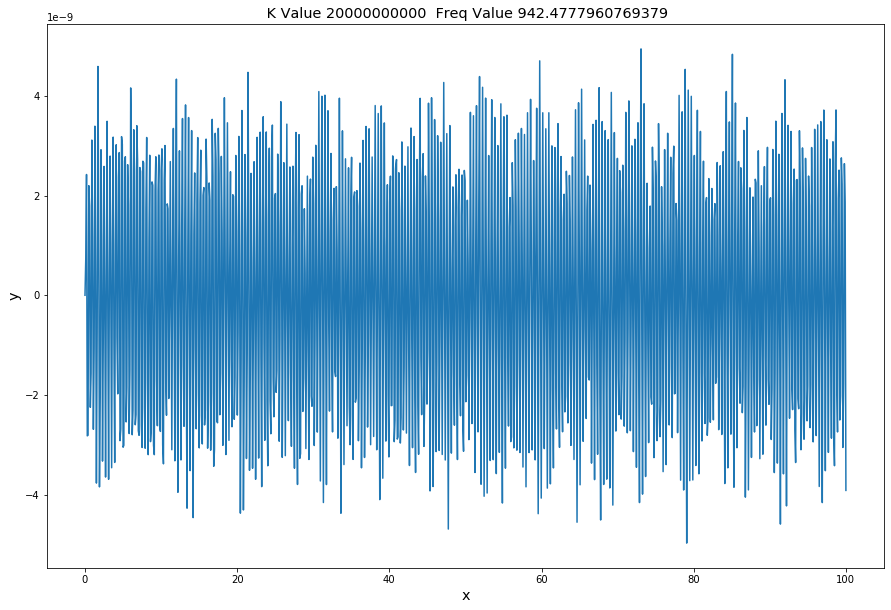



The amplitude of the plot below is: 6.222619756481653e-09


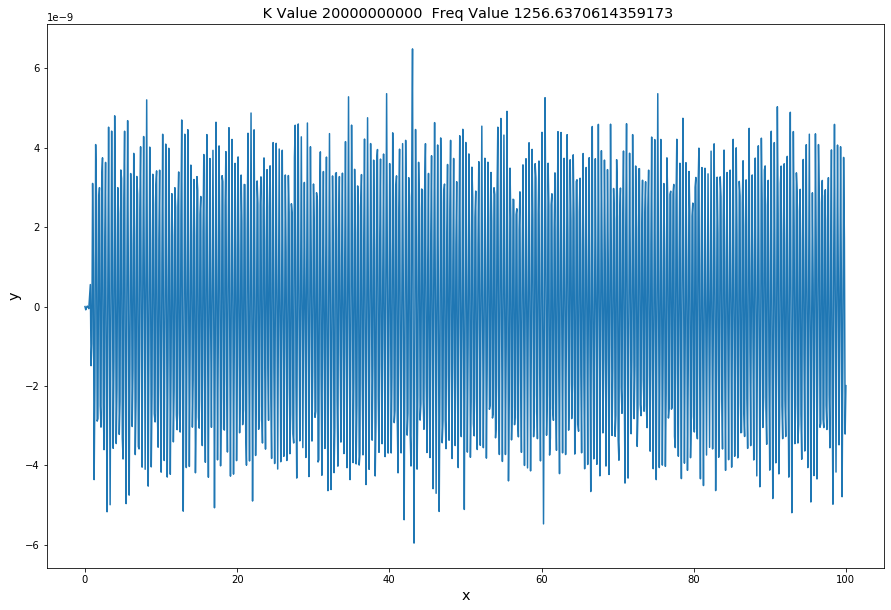



The amplitude of the plot below is: 1.223911979175253e-08


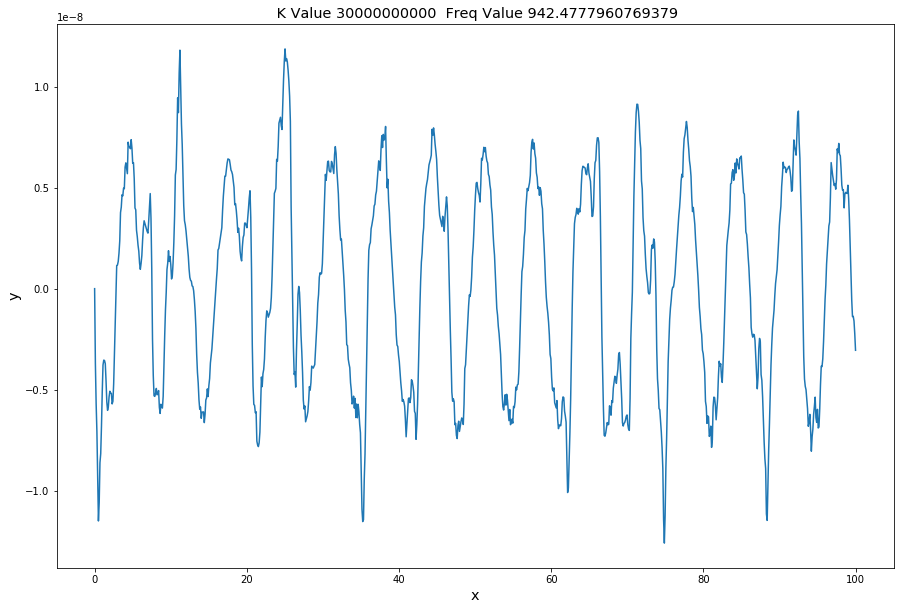



The amplitude of the plot below is: 3.815458749292827e-09


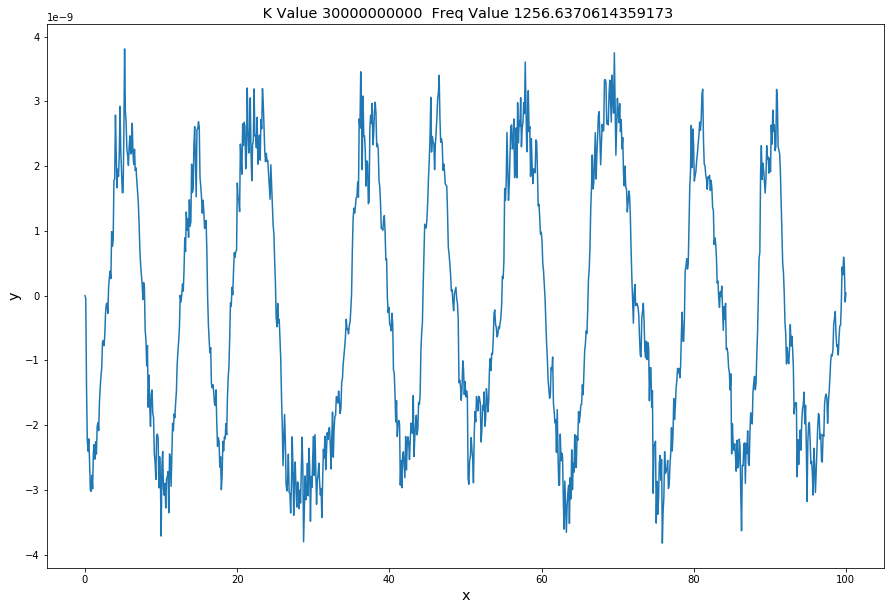



The amplitude of the plot below is: 3.4718257950862323e-09


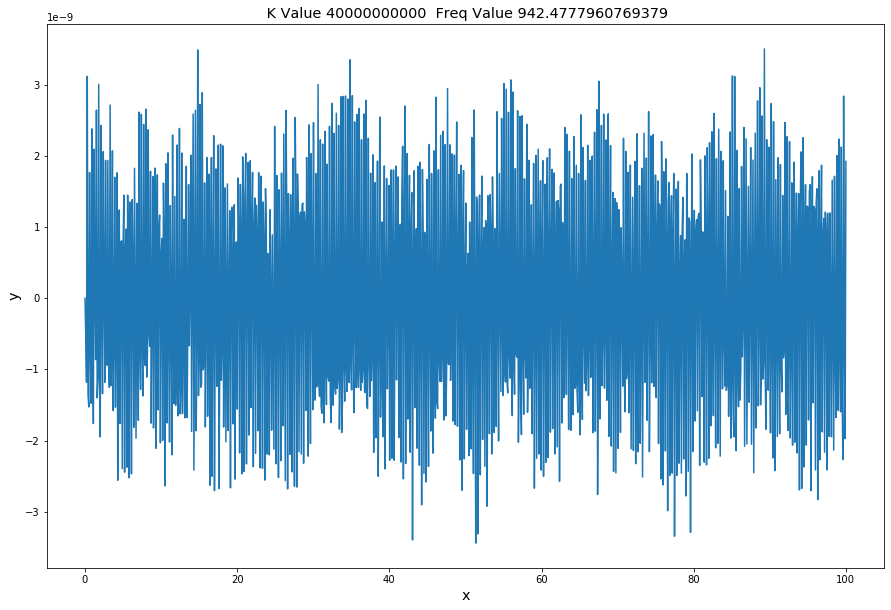



The amplitude of the plot below is: 3.4401748788128572e-09


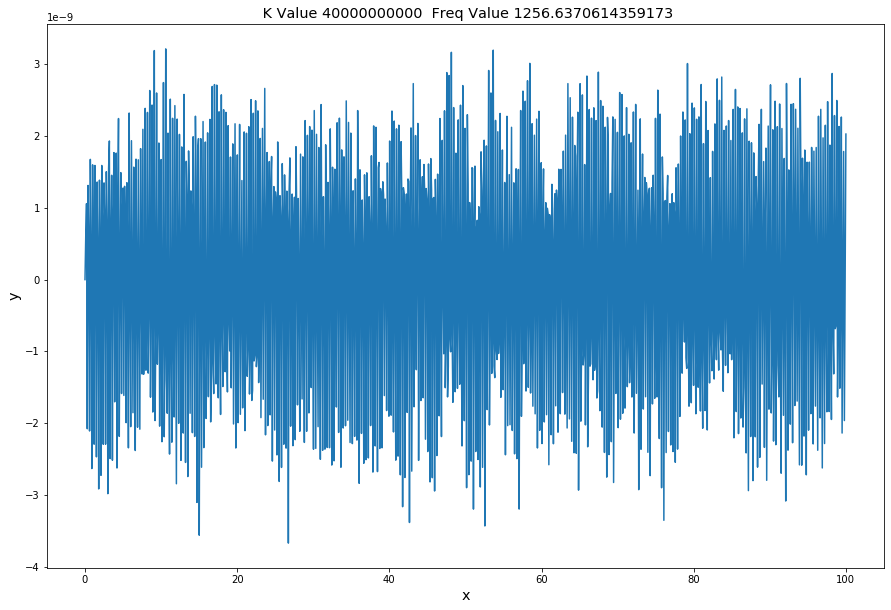



The amplitude of the plot below is: 2.9527093252062166e-09


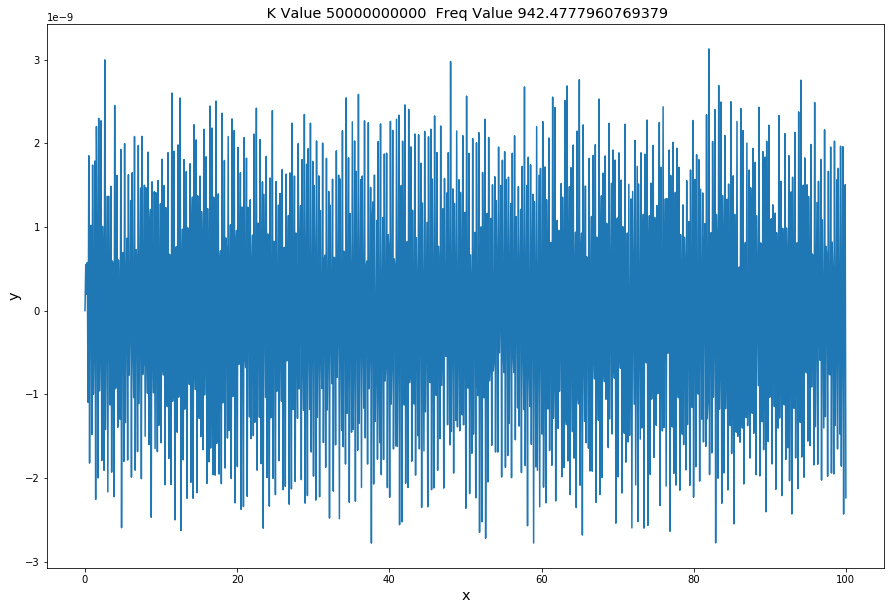



The amplitude of the plot below is: 3.4897983914229464e-09


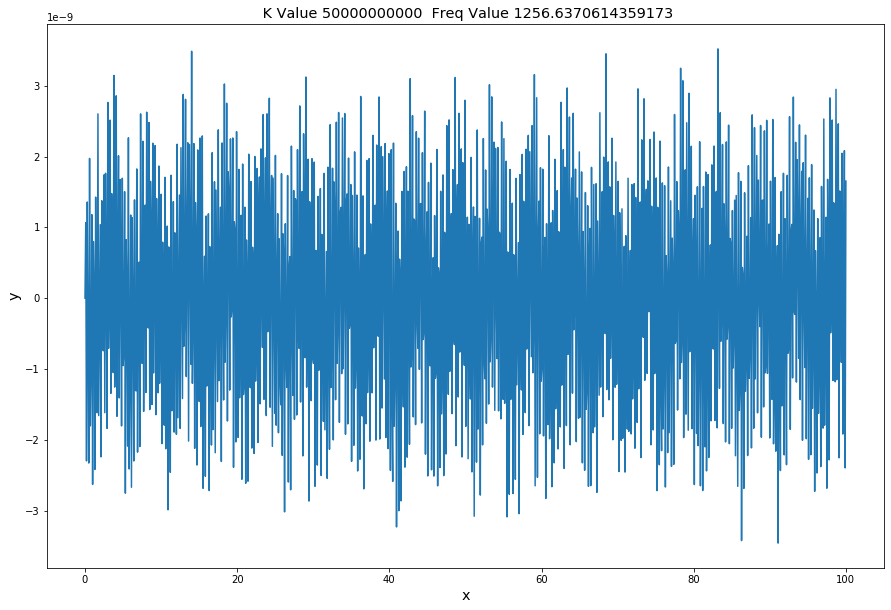



The amplitude of the plot below is: 2.810278028412592e-09


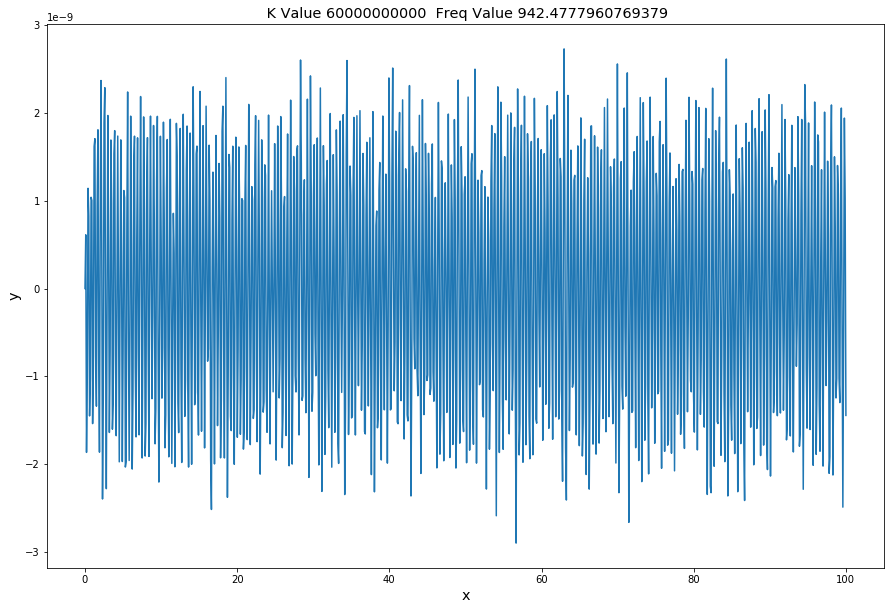



The amplitude of the plot below is: 3.0167307416872307e-09


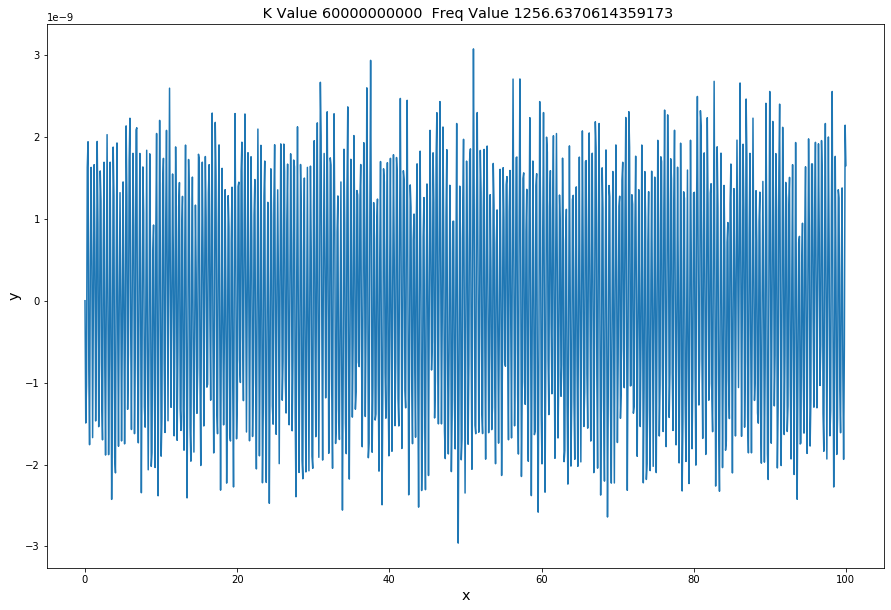



The amplitude of the plot below is: 2.4843495858934156e-09


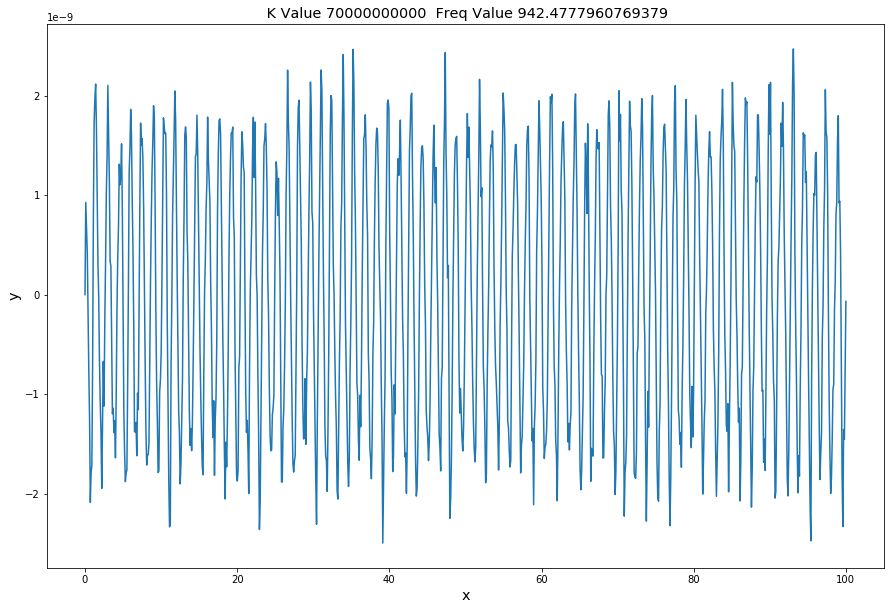



The amplitude of the plot below is: 2.7300606826909833e-09


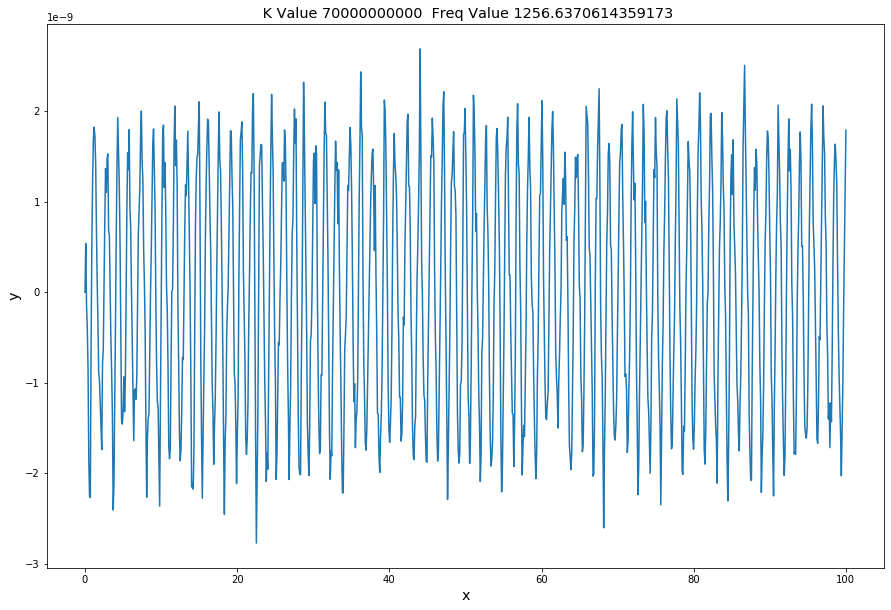

The amplitudes are the following:
[4.95641733e-09 6.22261976e-09 1.22391198e-08 3.81545875e-09
 3.47182580e-09 3.44017488e-09 2.95270933e-09 3.48979839e-09
 2.81027803e-09 3.01673074e-09 2.48434959e-09 2.73006068e-09]


The min amplitude is 2.4843495858934156e-09 occuring at freq of 942.4777960769379 rad/s and k value of 70000000000
[6.22261976e-09 3.81545875e-09 3.44017488e-09 3.48979839e-09
 3.01673074e-09 2.73006068e-09]


The min amplitude of high freq 2.7300606826909833e-09 occuring at freq of 1256.6370614359173 rad/s and k value of 70000000000


In [7]:
T_0  = 10.0

#print(type(mass))

C = T_0/(mass*(L**2))

amp = {}
AmpArray = np.zeros(12)
counter = 0
for i in range(len(k)):
    U0 = [0, 0]
    xs = np.linspace(0, 100, 1000)
    amp[i]={}
    for j in range(2):
        counter+=1
        Us = odeint(func,U0,xs, args = (A,B[i],C,b[j]))
        ys = Us[:,0]

        amp[i][j] = (max(ys)+abs(min(ys)))/2
        AmpArray[counter-1]= amp[i][j]
        print("\n\nThe amplitude of the plot below is: "+str(amp[i][j]))
        
        plt.figure(figsize=(15,10))
        plt.xlabel("x", fontsize = 'x-large')
        plt.ylabel("y", fontsize = 'x-large')
        plt.title(" K Value "+str(k[i])+"  Freq Value "+str(b[j]), fontsize = 'x-large', loc = "Center")
        plt.plot(xs,ys);
        plt.show()

        
import math as m
#print("The amplitudes for K-values:Freq Values"+str(amp))
print("The amplitudes are the following:\n"+str(AmpArray))
min_val = min(AmpArray)
min_index = min(range(len(AmpArray)), key=AmpArray.__getitem__)

print("\n\nThe min amplitude is "+ str(min_val)+" occuring at freq of "+str(b[min_index%2])+" rad/s and k value of "+str(k[m.floor(min_index/2)]))

HighFreqAmp = np.zeros(6)
for i in range(6):
    HighFreqAmp[i]=AmpArray[i*2+1]
    
print(HighFreqAmp)
min_val2 = min(HighFreqAmp)
min_index2 = min(range(len(HighFreqAmp)), key=HighFreqAmp.__getitem__)
#print(min_index2)
print("\n\nThe min amplitude of high freq "+ str(min_val2)+" occuring at freq of "+str(b[min_index2%2])+" rad/s and k value of "+str(k[(min_index2)]))




The amplitude of the plot below is: 4.956417334679249e-09


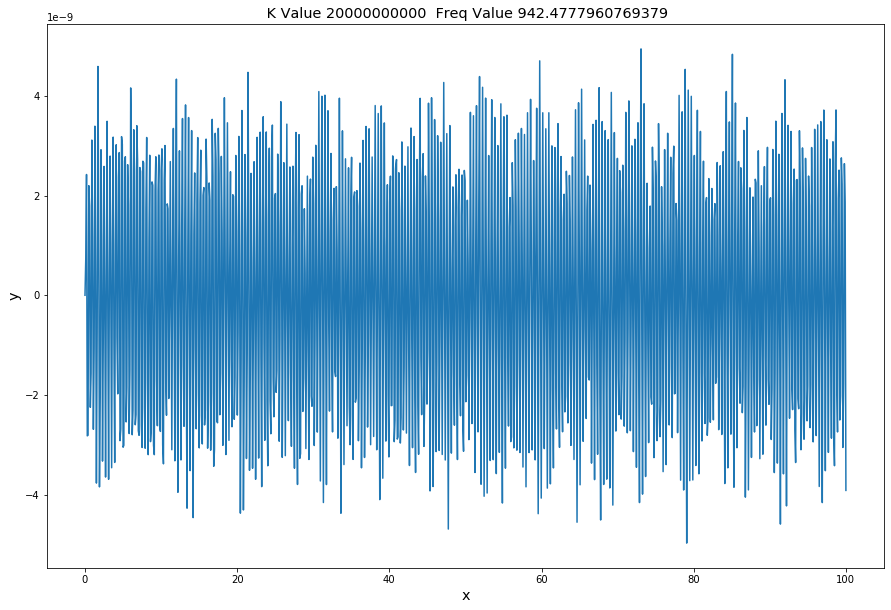



The amplitude of the plot below is: 6.222619756481653e-09


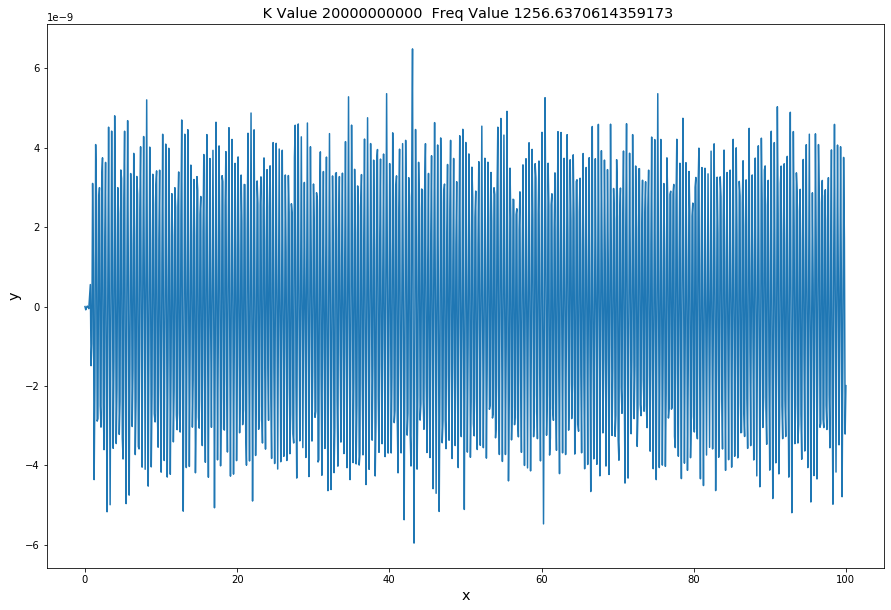



The amplitude of the plot below is: 1.223911979175253e-08


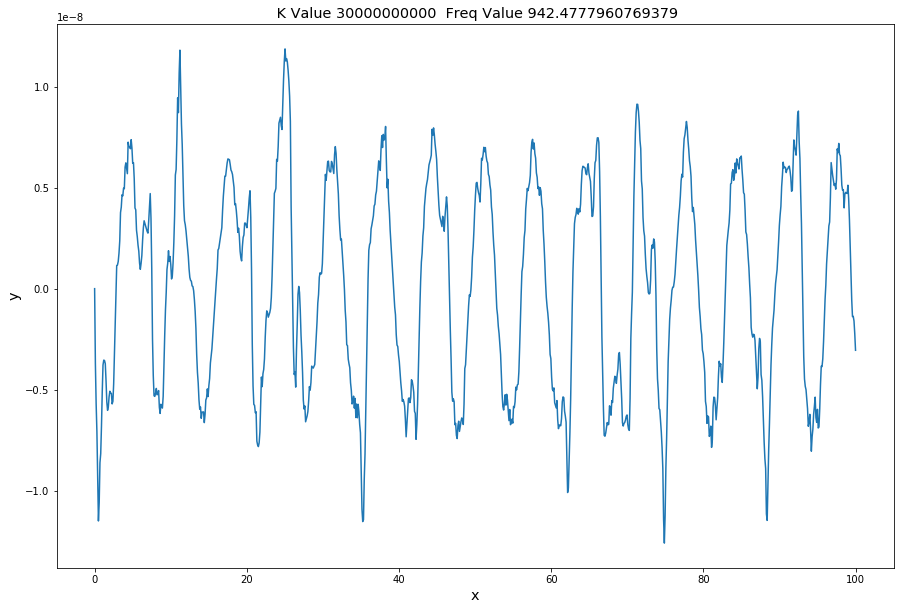



The amplitude of the plot below is: 3.815458749292827e-09


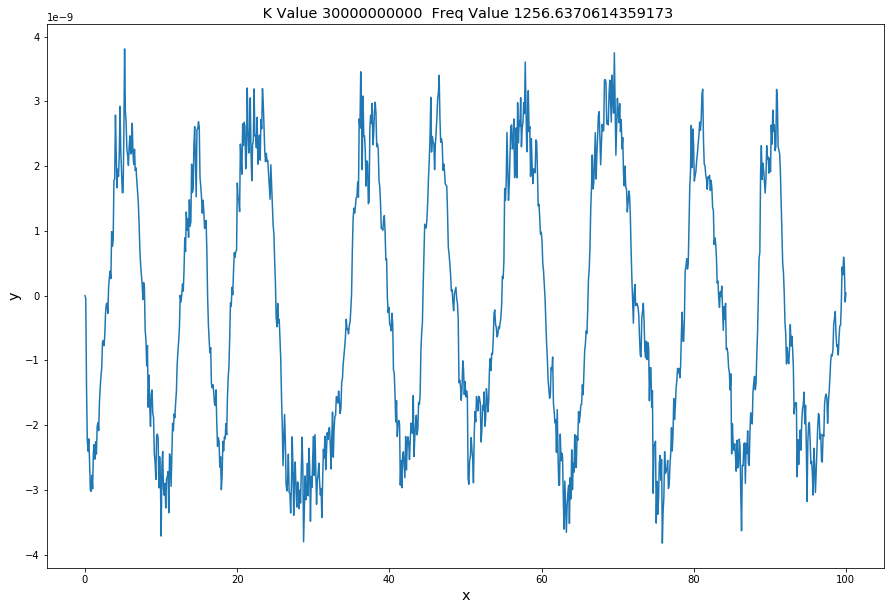



The amplitude of the plot below is: 3.4718257950862323e-09


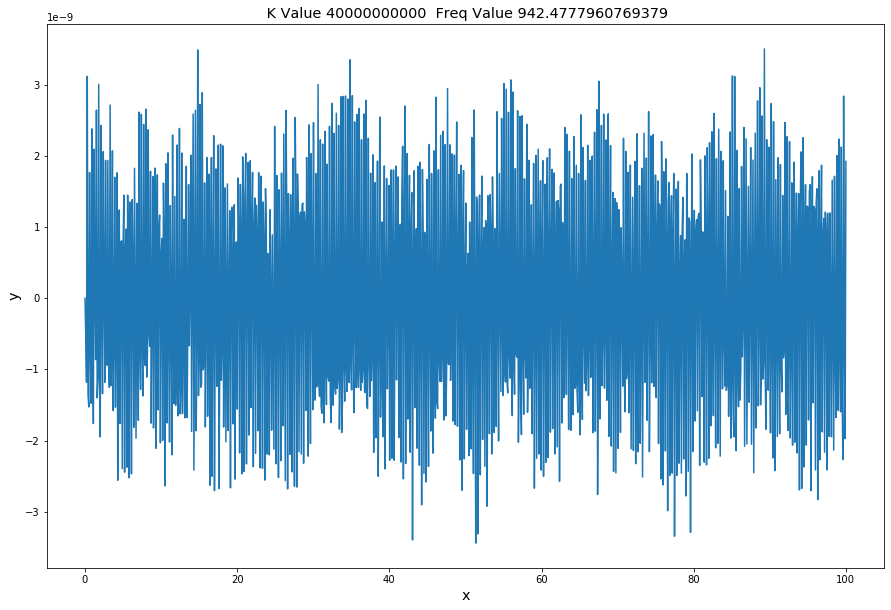



The amplitude of the plot below is: 3.4401748788128572e-09


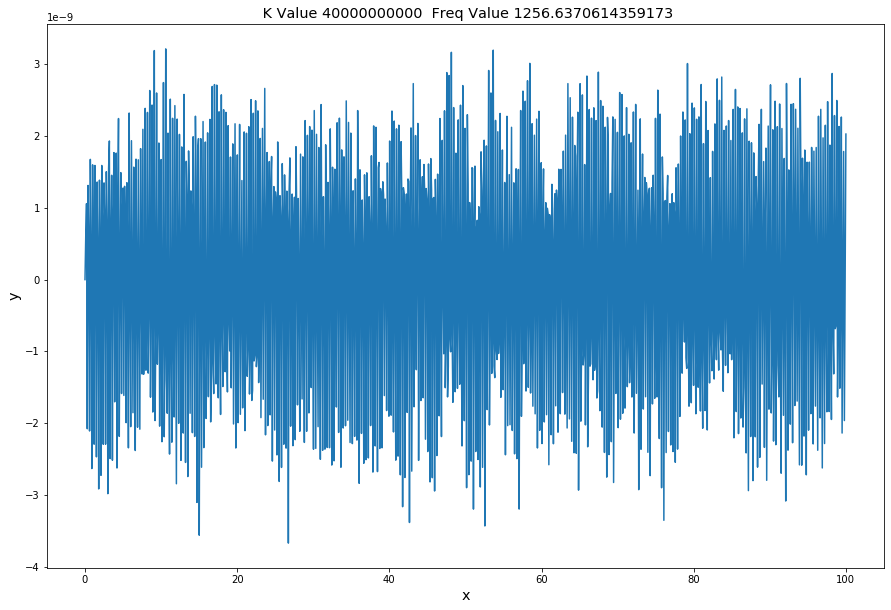



The amplitude of the plot below is: 2.9527093252062166e-09


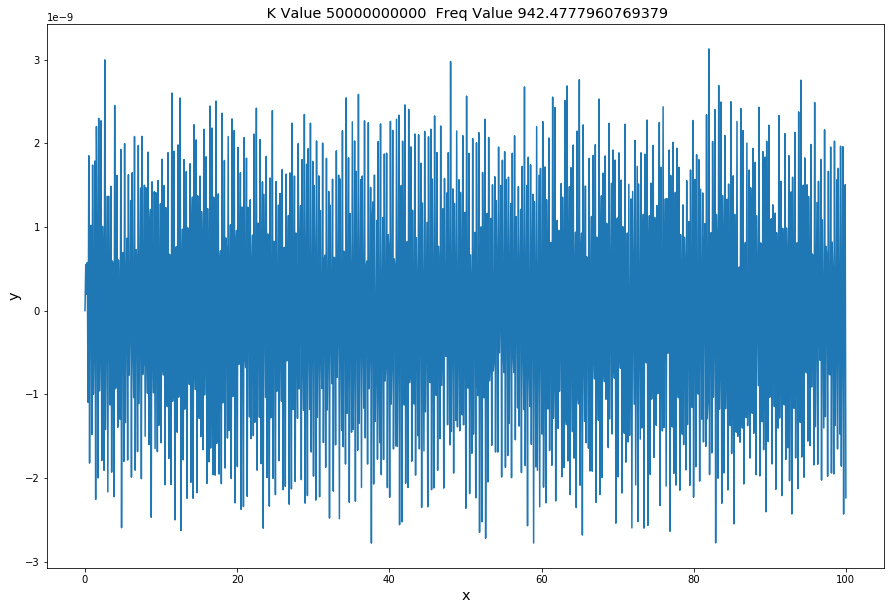



The amplitude of the plot below is: 3.4897983914229464e-09


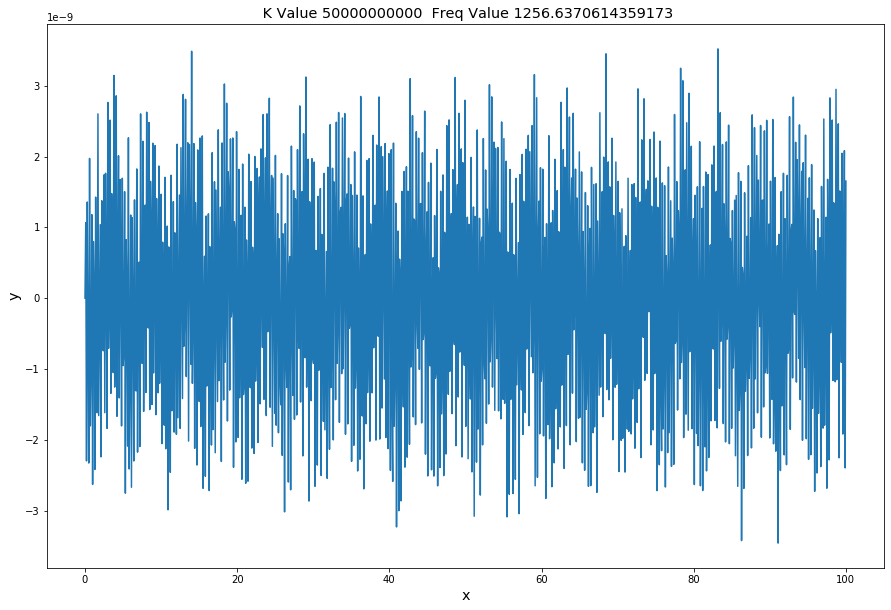



The amplitude of the plot below is: 2.810278028412592e-09


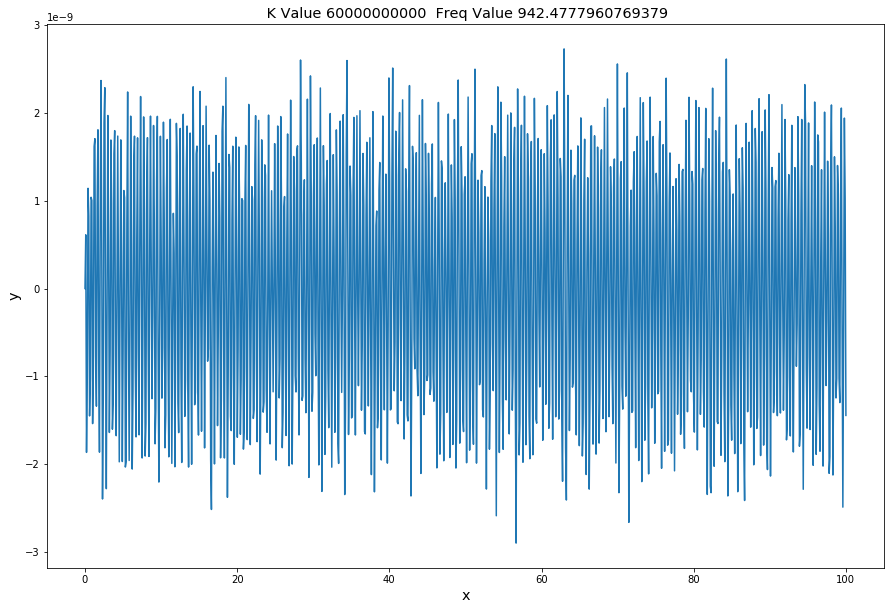



The amplitude of the plot below is: 3.0167307416872307e-09


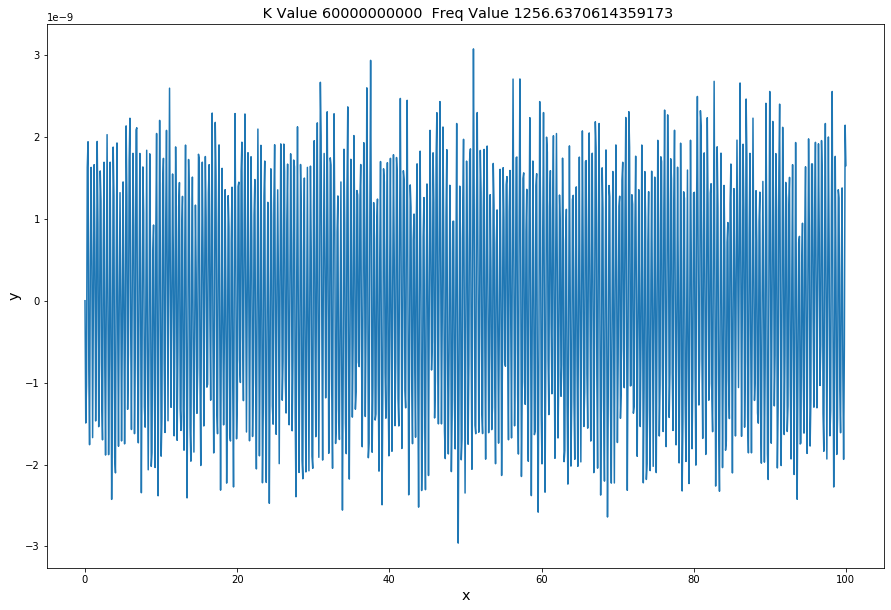



The amplitude of the plot below is: 2.4843495858934156e-09


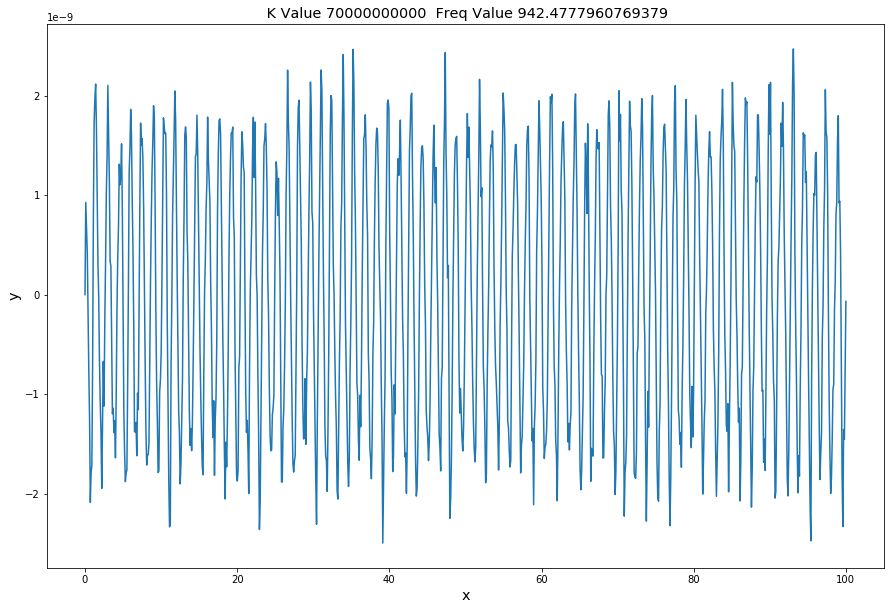



The amplitude of the plot below is: 2.7300606826909833e-09


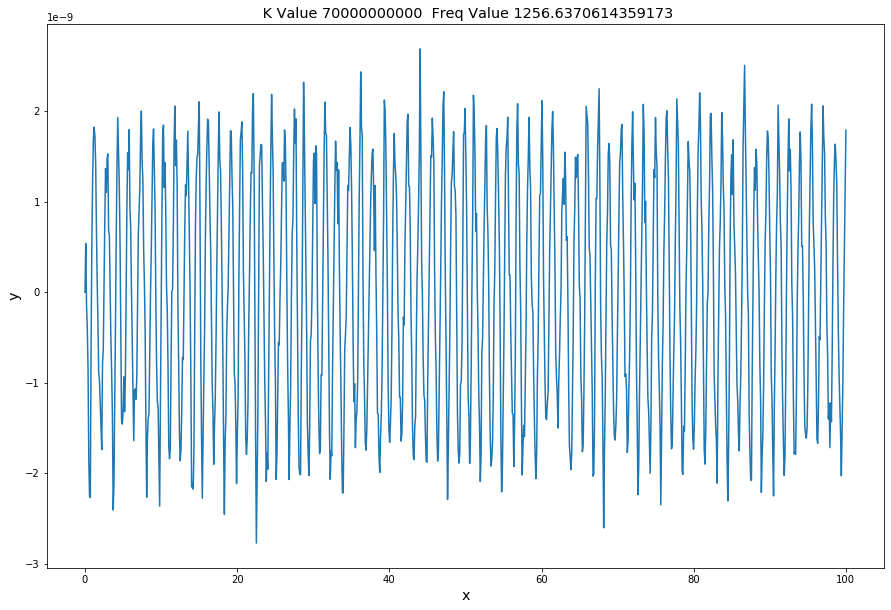

The amplitudes are the following:
[4.95641733e-09 6.22261976e-09 1.22391198e-08 3.81545875e-09
 3.47182580e-09 3.44017488e-09 2.95270933e-09 3.48979839e-09
 2.81027803e-09 3.01673074e-09 2.48434959e-09 2.73006068e-09]


The min amplitude is 2.4843495858934156e-09 occuring at freq of 942.4777960769379 rad/s and k value of 70000000000
[6.22261976e-09 3.81545875e-09 3.44017488e-09 3.48979839e-09
 3.01673074e-09 2.73006068e-09]


The min amplitude of high freq 2.7300606826909833e-09 occuring at freq of 1256.6370614359173 rad/s and k value of 70000000000


In [8]:


amp = {}
AmpArray = np.zeros(12)
counter = 0
for i in range(len(k)):
    U0 = [0, 0]
    xs = np.linspace(0, 100, 1000)
    amp[i]={}
    for j in range(2):
        counter+=1
        Us = odeint(func,U0,xs, args = (A,B[i],C,b[j]))
        ys = Us[:,0]

        amp[i][j] = (max(ys)+abs(min(ys)))/2
        AmpArray[counter-1]= amp[i][j]
        print("\n\nThe amplitude of the plot below is: "+str(amp[i][j]))
        
        plt.figure(figsize=(15,10))
        plt.xlabel("x", fontsize = 'x-large')
        plt.ylabel("y", fontsize = 'x-large')
        plt.title(" K Value "+str(k[i])+"  Freq Value "+str(b[j]), fontsize = 'x-large', loc = "Center")
        plt.plot(xs,ys);
        plt.show()

        
import math as m
#print("The amplitudes for K-values:Freq Values"+str(amp))
print("The amplitudes are the following:\n"+str(AmpArray))
min_val = min(AmpArray)
min_index = min(range(len(AmpArray)), key=AmpArray.__getitem__)

print("\n\nThe min amplitude is "+ str(min_val)+" occuring at freq of "+str(b[min_index%2])+" rad/s and k value of "+str(k[m.floor(min_index/2)]))

HighFreqAmp = np.zeros(6)
for i in range(6):
    HighFreqAmp[i]=AmpArray[i*2+1]
    
print(HighFreqAmp)
min_val2 = min(HighFreqAmp)
min_index2 = min(range(len(HighFreqAmp)), key=HighFreqAmp.__getitem__)
#print(min_index2)
print("\n\nThe min amplitude of high freq "+ str(min_val2)+" occuring at freq of "+str(b[min_index2%2])+" rad/s and k value of "+str(k[(min_index2)]))




The amplitude of the plot below is: 8.469609869956763e-12


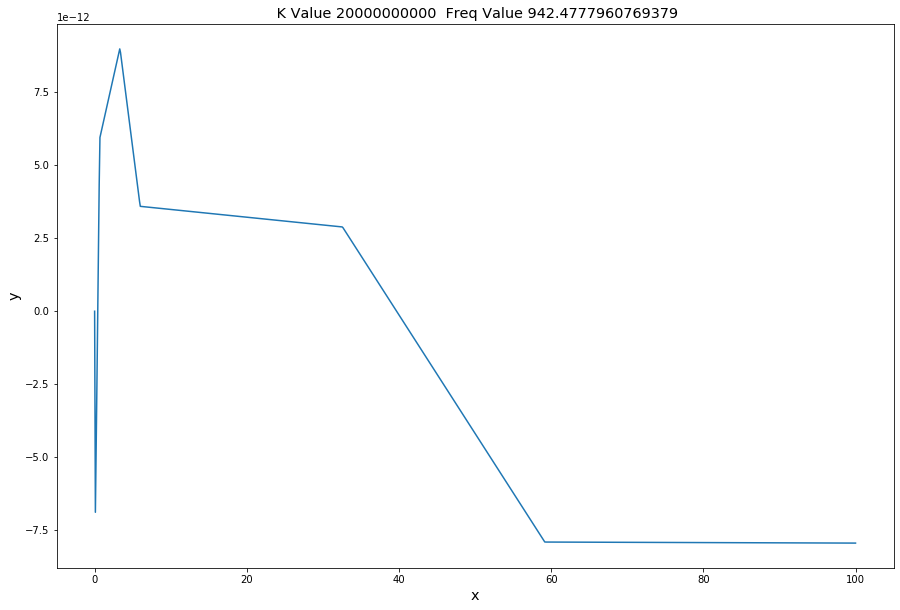



The amplitude of the plot below is: 8.222493051193e-12


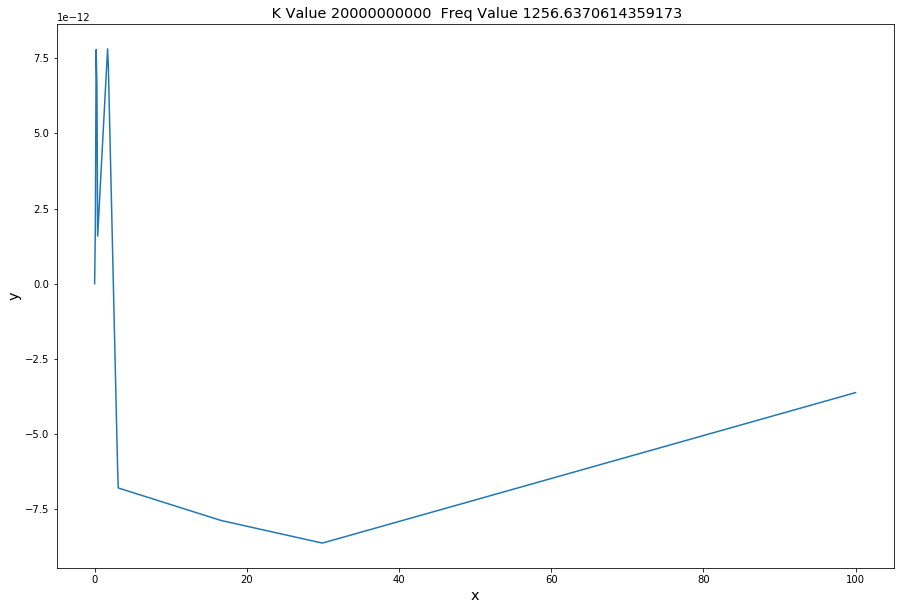



The amplitude of the plot below is: 4.4838009595756945e-12


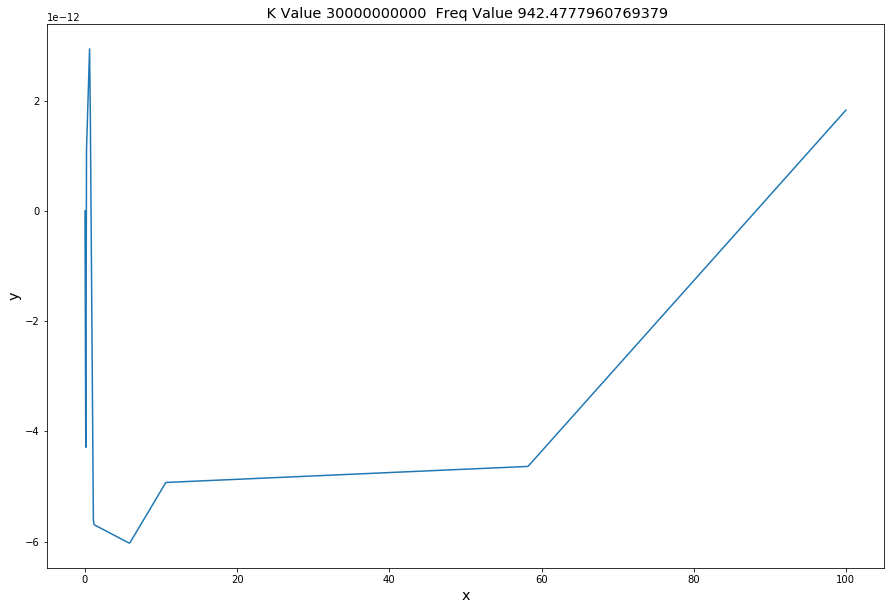



The amplitude of the plot below is: 5.749294714616203e-12


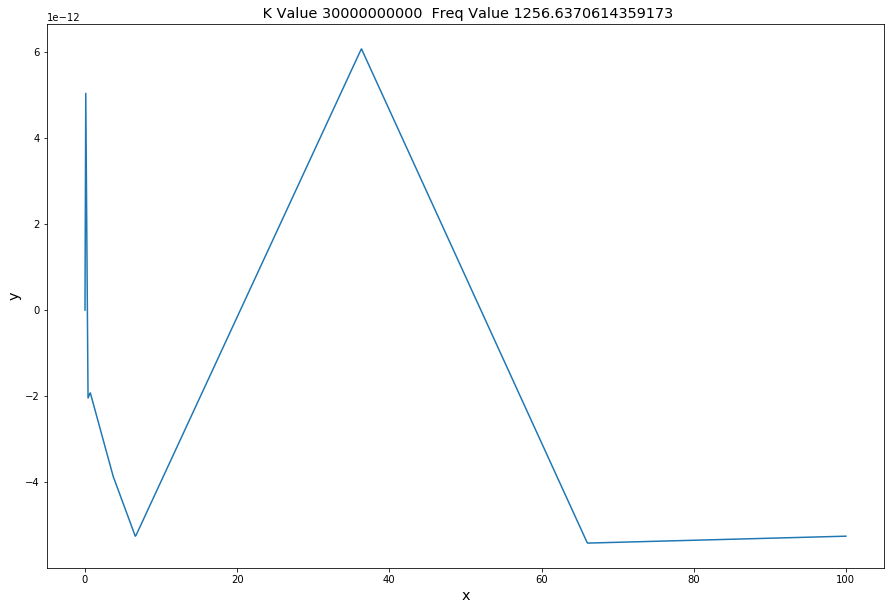



The amplitude of the plot below is: 4.3452418429500184e-12


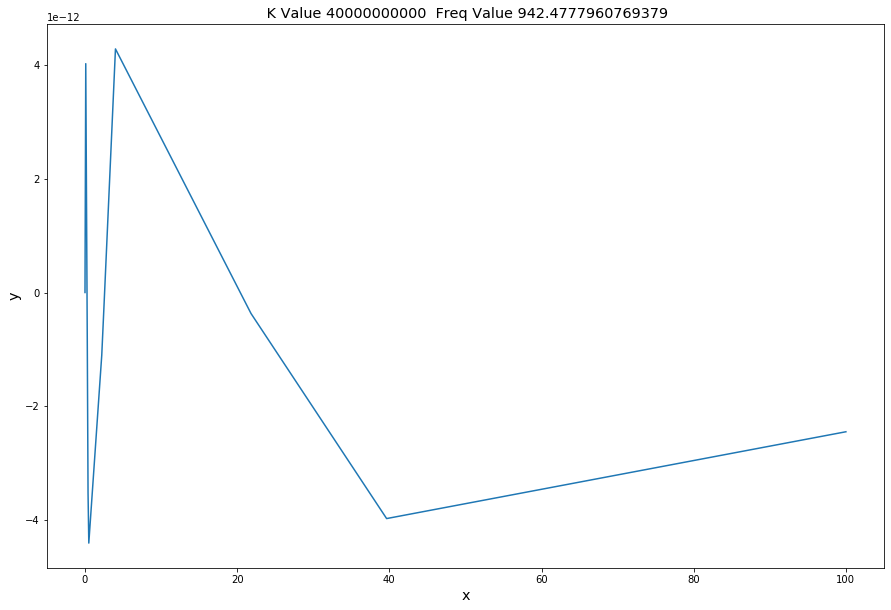



The amplitude of the plot below is: 4.478486246017137e-12


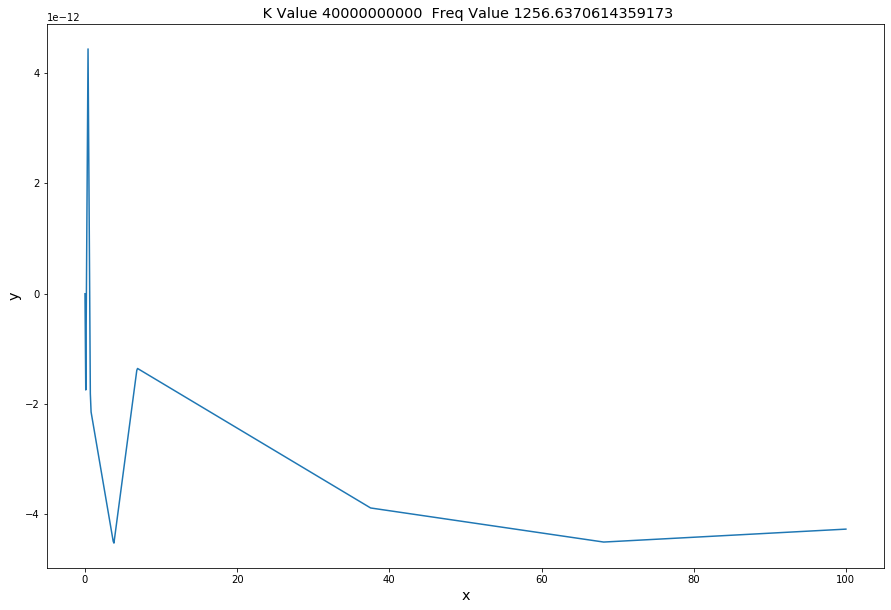



The amplitude of the plot below is: 3.236976856520696e-12


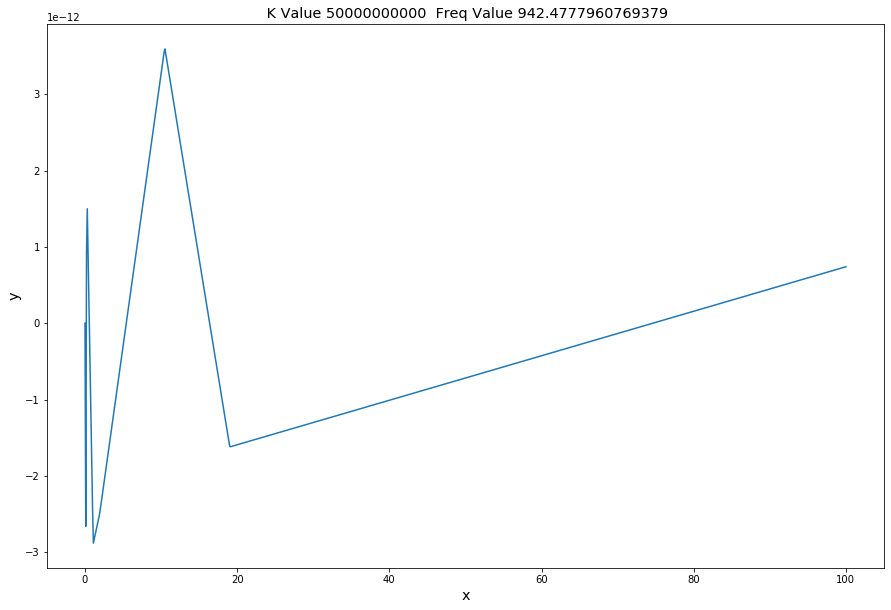



The amplitude of the plot below is: 3.5851196544354032e-12


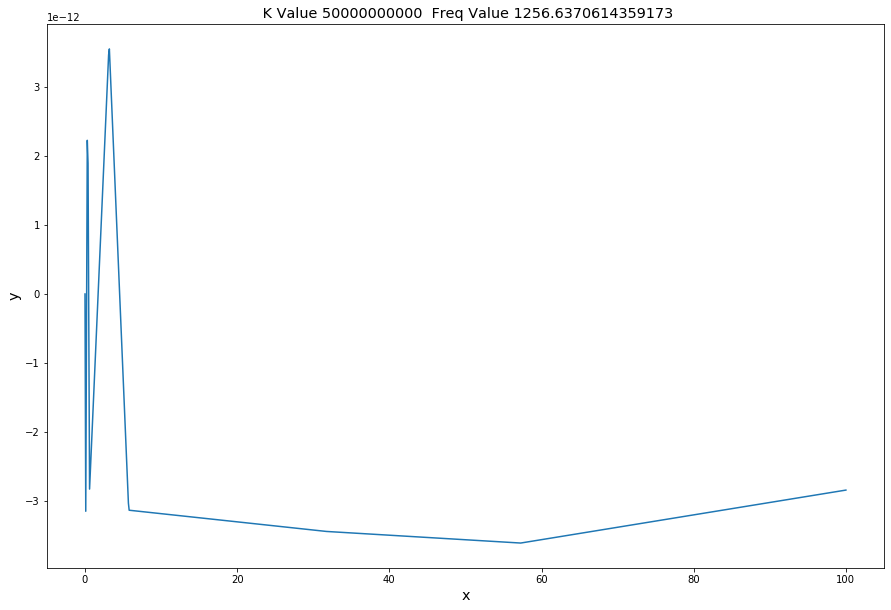



The amplitude of the plot below is: 2.8947525692682e-12


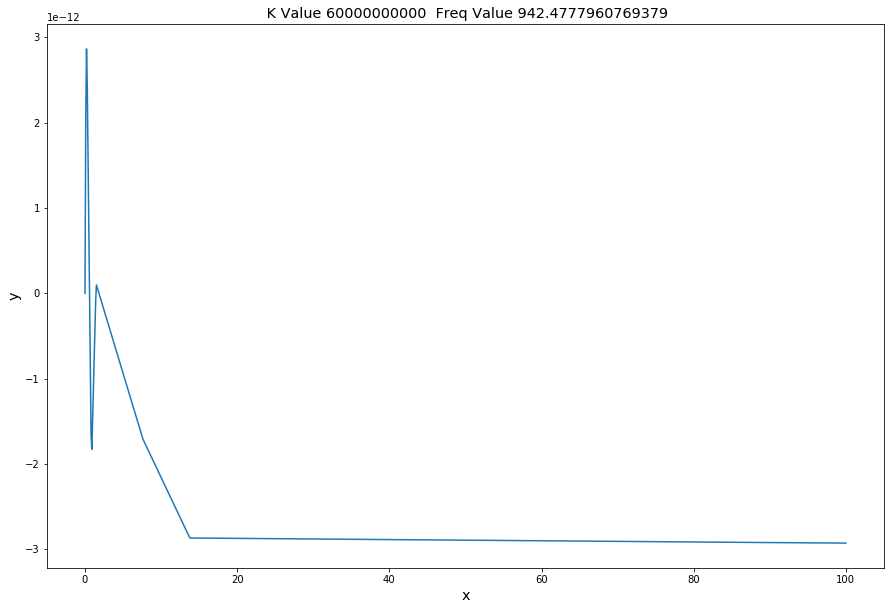



The amplitude of the plot below is: 2.344039222432965e-12


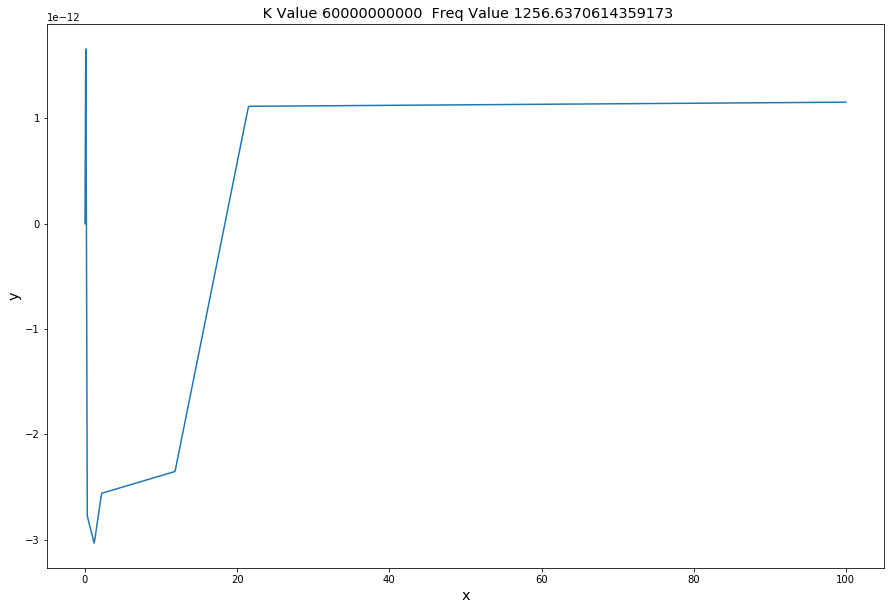



The amplitude of the plot below is: 2.407938253352299e-12


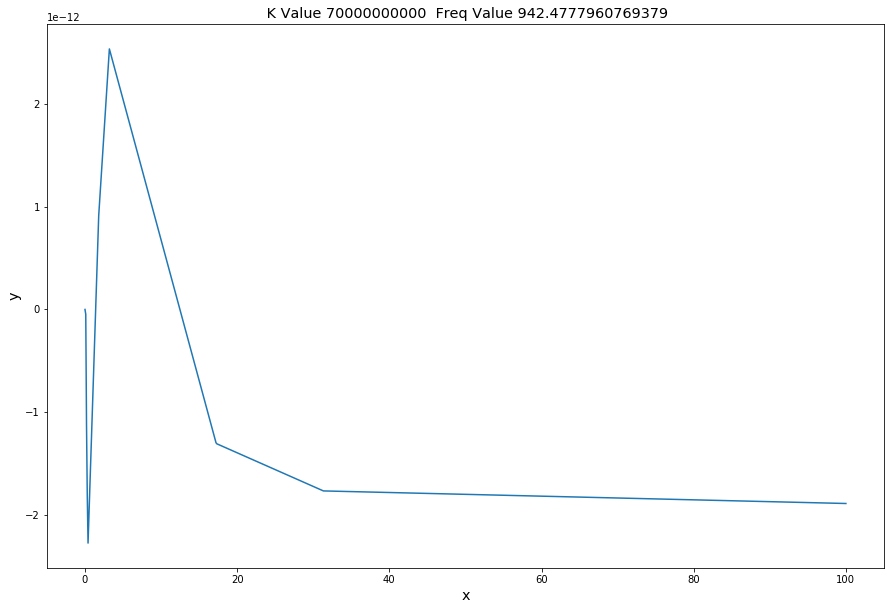



The amplitude of the plot below is: 2.3500399250624175e-11


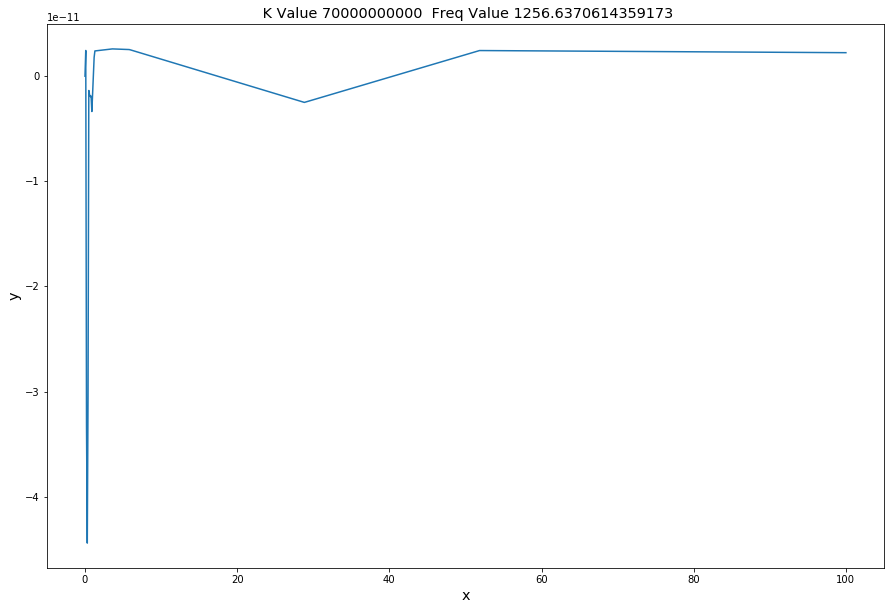

The amplitudes are the following:
[8.46960987e-12 8.22249305e-12 4.48380096e-12 5.74929471e-12
 4.34524184e-12 4.47848625e-12 3.23697686e-12 3.58511965e-12
 2.89475257e-12 2.34403922e-12 2.40793825e-12 2.35003993e-11]


The min amplitude is 2.344039222432965e-12 occuring at freq of 1256.6370614359173 rad/s and k value of 60000000000
[8.22249305e-12 5.74929471e-12 4.47848625e-12 3.58511965e-12
 2.34403922e-12 2.35003993e-11]


The min amplitude of high freq 2.344039222432965e-12 occuring at freq of 942.4777960769379 rad/s and k value of 60000000000


In [9]:
T_0  = 1.0

#print(type(mass))

C = T_0/(mass*(L**2))

amp = {}
AmpArray = np.zeros(12)
counter = 0
for i in range(len(k)):
    U0 = [0, 0]
    xs = np.linspace(0, 100, 1000)
    amp[i]={}
    for j in range(2):
        counter+=1
        Us = odeint(func,U0,xs, args = (A,B[i],C,b[j]))
        ys = Us[:,0]

        amp[i][j] = (max(ys)+abs(min(ys)))/2
        AmpArray[counter-1]= amp[i][j]
        print("\n\nThe amplitude of the plot below is: "+str(amp[i][j]))
        
        plt.figure(figsize=(15,10))
        plt.xlabel("x", fontsize = 'x-large')
        plt.ylabel("y", fontsize = 'x-large')
        plt.title(" K Value "+str(k[i])+"  Freq Value "+str(b[j]), fontsize = 'x-large', loc = "Center")
        plt.plot(xs,ys);
        plt.show()

        
import math as m
#print("The amplitudes for K-values:Freq Values"+str(amp))
print("The amplitudes are the following:\n"+str(AmpArray))
min_val = min(AmpArray)
min_index = min(range(len(AmpArray)), key=AmpArray.__getitem__)

print("\n\nThe min amplitude is "+ str(min_val)+" occuring at freq of "+str(b[min_index%2])+" rad/s and k value of "+str(k[m.floor(min_index/2)]))

HighFreqAmp = np.zeros(6)
for i in range(6):
    HighFreqAmp[i]=AmpArray[i*2+1]
    
print(HighFreqAmp)
min_val2 = min(HighFreqAmp)
min_index2 = min(range(len(HighFreqAmp)), key=HighFreqAmp.__getitem__)
#print(min_index2)
print("\n\nThe min amplitude of high freq "+ str(min_val2)+" occuring at freq of "+str(b[min_index2%2])+" rad/s and k value of "+str(k[(min_index2)]))


### Putting Plots together for T_0 = 1

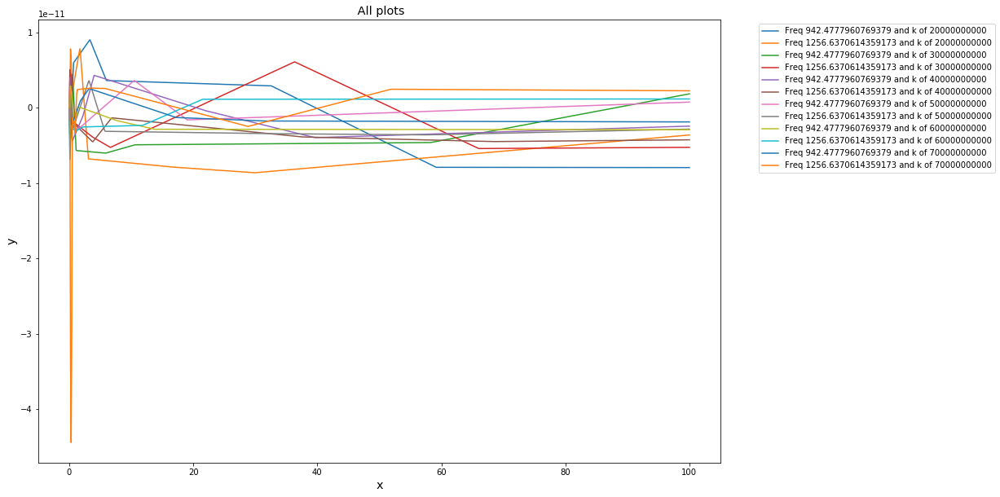

The amplitudes are the following:
[8.46960987e-12 8.22249305e-12 4.48380096e-12 5.74929471e-12
 4.34524184e-12 4.47848625e-12 3.23697686e-12 3.58511965e-12
 2.89475257e-12 2.34403922e-12 2.40793825e-12 2.35003993e-11]


The min amplitude is 2.344039222432965e-12 occuring at freq of 1256.6370614359173 rad/s and k value of 60000000000


The min amplitude of high freq 2.344039222432965e-12 occuring at freq of 942.4777960769379 rad/s and k value of 40000000000


In [10]:


amp = {}
AmpArray = np.zeros(12)
counter = 0
plt.figure(figsize=(15,10))

for i in range(len(k)):
    U0 = [0, 0]
    xs = np.linspace(0, 100, 1000)
    amp[i]={}
    
    
    for j in range(2):
        counter+=1
        Us = odeint(func,U0,xs, args = (A,B[i],C,b[j]))
        ys = Us[:,0]

        amp[i][j] = (max(ys)+abs(min(ys)))/2
        AmpArray[counter-1]= amp[i][j]
        #print("\n\nThe amplitude of the plot below is: "+str(amp[i][j]))
        
        PlotName = "Freq "+str(b[j])+" and k of "+str(k[i])
        
        plt.xlabel("x", fontsize = 'x-large')
        plt.ylabel("y", fontsize = 'x-large')
        plt.title(" All plots", fontsize = 'x-large', loc = "Center")
        plt.plot(xs,ys, label= PlotName)
        plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()
        
import math as m
#print("The amplitudes for K-values:Freq Values"+str(amp))
print("The amplitudes are the following:\n"+str(AmpArray))
min_val = min(AmpArray)
min_index = min(range(len(AmpArray)), key=AmpArray.__getitem__)

print("\n\nThe min amplitude is "+ str(min_val)+" occuring at freq of "+str(b[min_index%2])+" rad/s and k value of "+str(k[m.floor(min_index/2)]))

HighFreqAmp = np.zeros(6)
for i in range(6):
    HighFreqAmp[i]=AmpArray[i*2+1]
    
#print(HighFreqAmp)
min_val2 = min(HighFreqAmp)
min_index2 = min(range(len(HighFreqAmp)), key=HighFreqAmp.__getitem__)
print("\n\nThe min amplitude of high freq "+ str(min_val2)+" occuring at freq of "+str(b[min_index2%2])+" rad/s and k value of "+str(k[m.floor(min_index2/2)]))


### T_0 = 1

[ 942.47779608 1021.01761242 1099.55742876 1178.0972451  1256.63706144]
[8.46960987e-12 4.48380096e-12 4.34524184e-12 3.23697686e-12
 2.89475257e-12 2.40793825e-12]


The min amplitude is 2.407938253352299e-12 k value of 70000000000


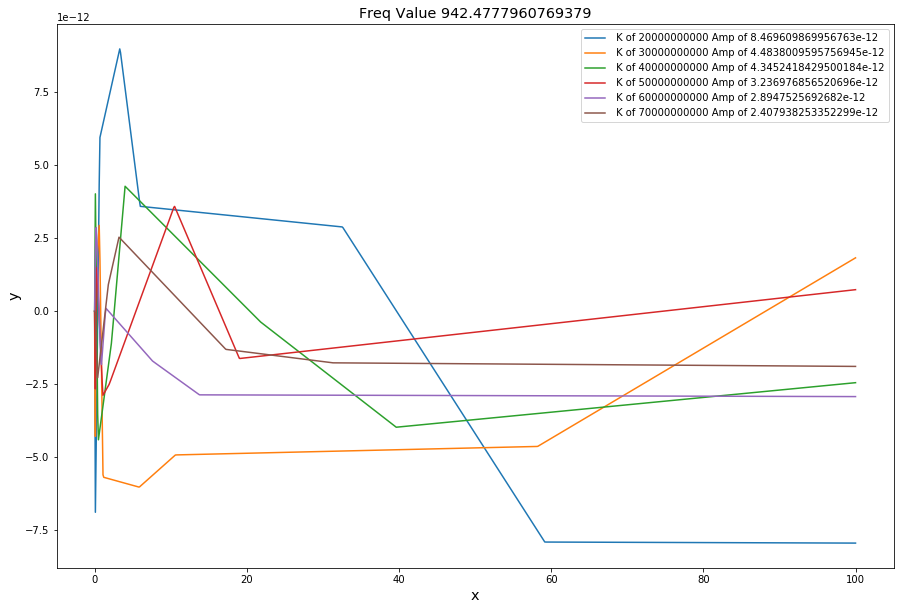

[7.58635248e-12 5.81182257e-12 3.95261502e-12 3.11942533e-12
 2.68912094e-12 2.46737067e-12]


The min amplitude is 2.467370672756094e-12 k value of 70000000000


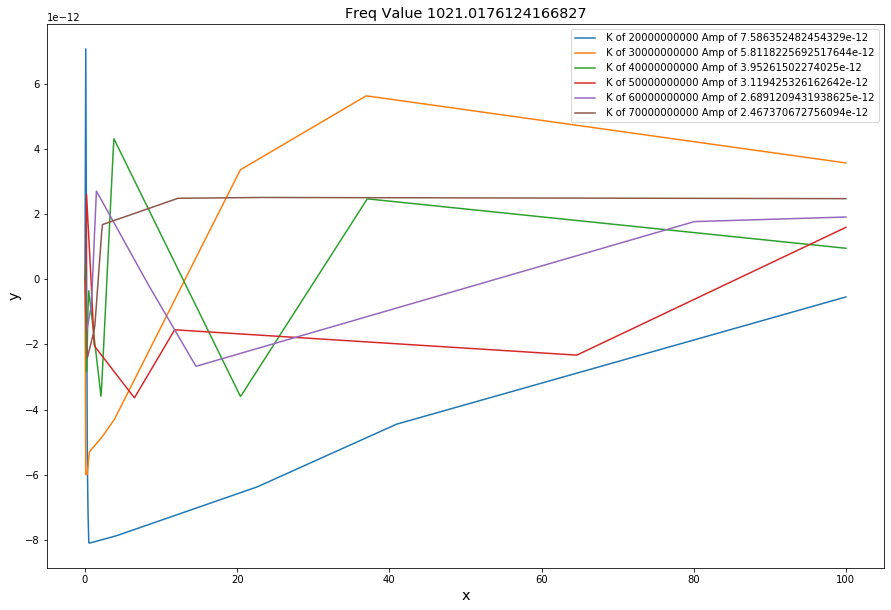

[6.72607367e-12 4.80006014e-12 4.05080790e-12 3.60319090e-12
 2.06976542e-12 2.34951186e-12]


The min amplitude is 2.0697654171949695e-12 k value of 60000000000


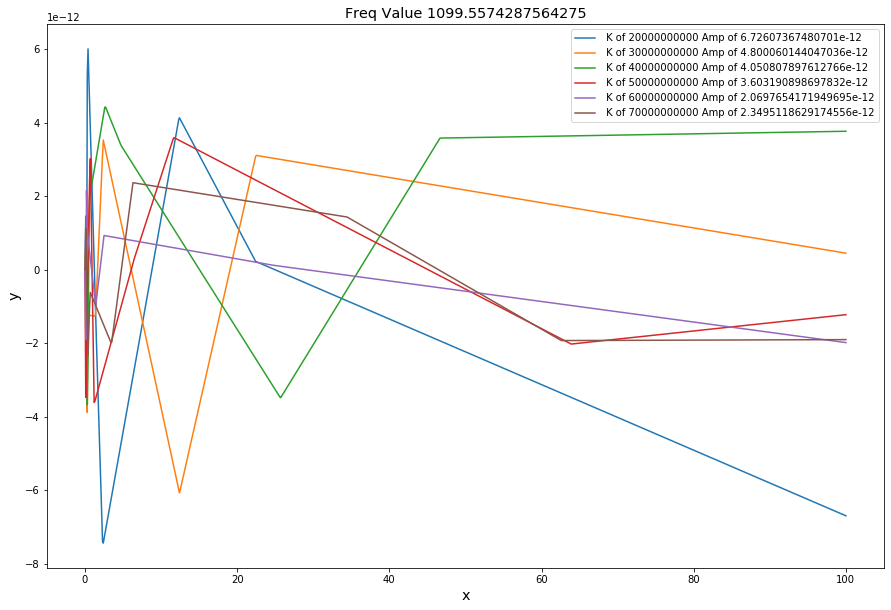

[8.92175504e-12 5.00851581e-12 4.46798505e-12 2.66022233e-12
 2.81994125e-12 2.47576706e-12]


The min amplitude is 2.475767058636512e-12 k value of 70000000000


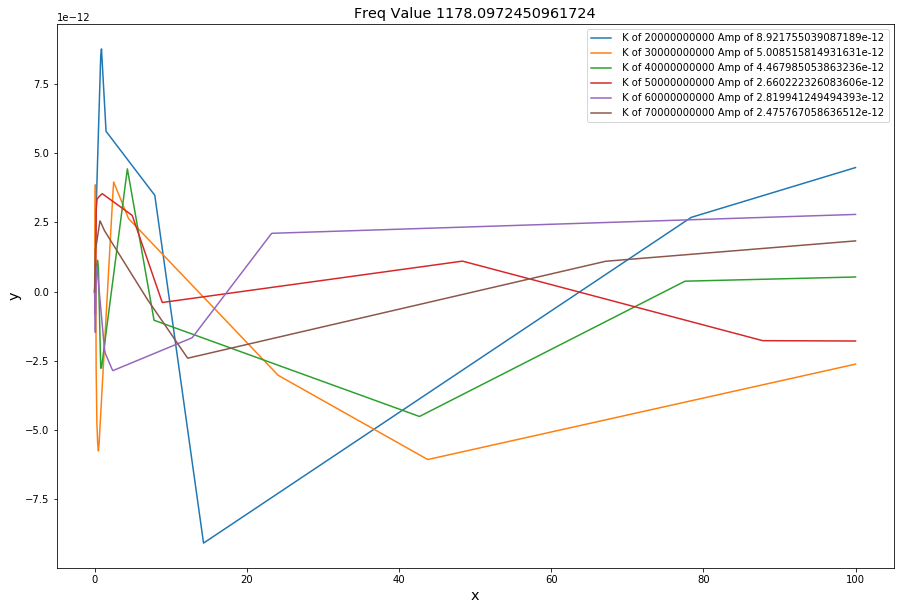

[8.22249305e-12 5.74929471e-12 4.47848625e-12 3.58511965e-12
 2.34403922e-12 2.35003993e-11]


The min amplitude is 2.344039222432965e-12 k value of 60000000000


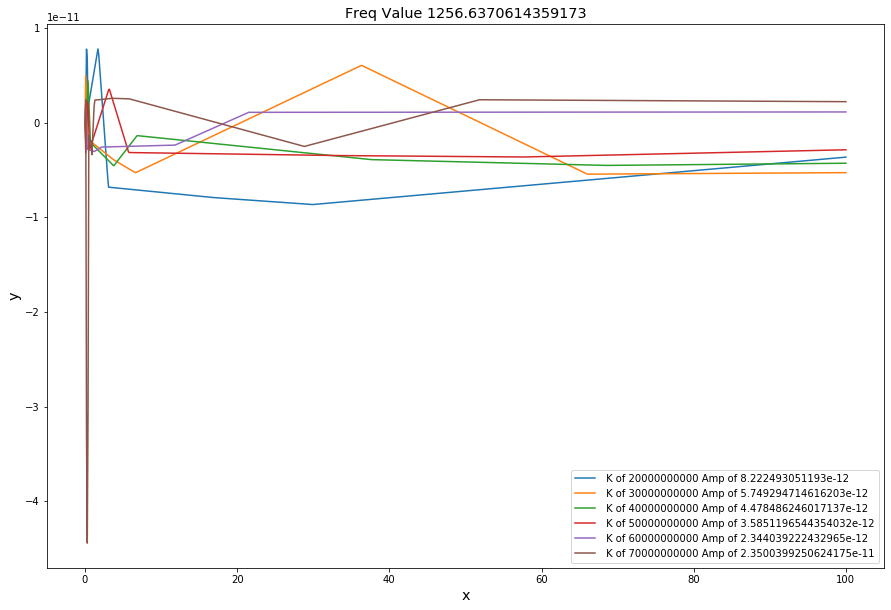

In [11]:
T_0 = 1

C = T_0/(mass*(L**2))


b = np.ones(5)
for a  in range(len(b)):
    b[a]=np.pi*(300+25*a)
print(b)

amp = {}
AmpArray = np.zeros(len(k))


for i in range(len(b)):
    U0 = [0, 0]
    xs = np.linspace(0, 100, 1000)
    amp[i]={}
    
    plt.figure(figsize=(15,10))
    
    for j in range(len(k)):
        
        Us = odeint(func,U0,xs, args = (A,B[j],C,b[i]))
        ys = Us[:,0]

        amp[i][j] = (max(ys)+abs(min(ys)))/2
        AmpArray[j]= amp[i][j]
      
        #print("\n\nThe amplitude of the plot below is: "+str(amp[i][j]))
        
        PlotName = " K of "+str(k[j])+ " Amp of "+str(amp[i][j])
        
        plt.xlabel("x", fontsize = 'x-large')
        plt.ylabel("y", fontsize = 'x-large')
        plt.title("Freq Value "+str(b[i]), fontsize = 'x-large', loc = "Center")
        plt.plot(xs,ys, label= PlotName)
        plt.legend()
        
    print(AmpArray)   
    min_val = min(AmpArray)
    min_index = min(range(len(AmpArray)), key=AmpArray.__getitem__)

    print("\n\nThe min amplitude is "+ str(min_val)+" k value of "+str(k[(min_index)]))
    plt.show()
        
import math as m
#print("The amplitudes for K-values:Freq Values"+str(amp))


### T_0 = 10

[ 942.47779608 1021.01761242 1099.55742876 1178.0972451  1256.63706144]
[4.95641733e-09 1.22391198e-08 3.47182580e-09 2.95270933e-09
 2.81027803e-09 2.48434959e-09]


The min amplitude is 2.4843495858934156e-09 k value of 70000000000


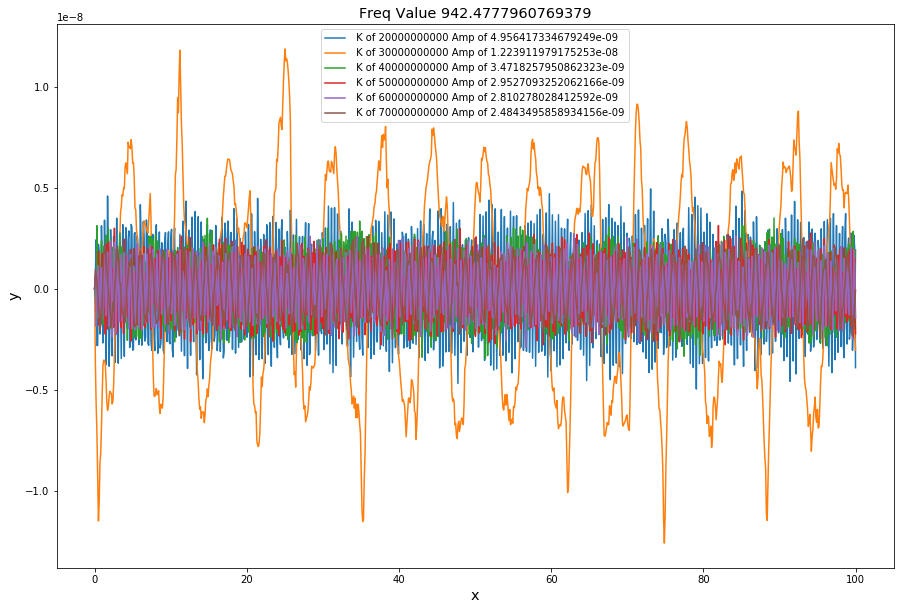

[4.86737217e-09 4.21036508e-09 3.65731728e-09 3.22674744e-09
 2.84627138e-09 2.64363281e-09]


The min amplitude is 2.6436328096671696e-09 k value of 70000000000


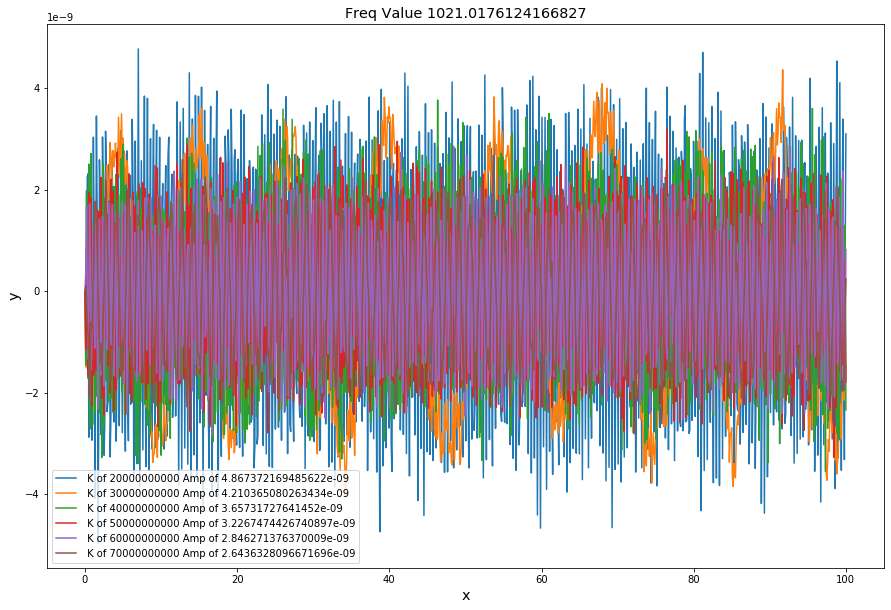

[5.39804117e-09 4.08465641e-09 3.37955687e-09 3.19662172e-09
 2.76755966e-09 2.51246875e-09]


The min amplitude is 2.5124687543687607e-09 k value of 70000000000


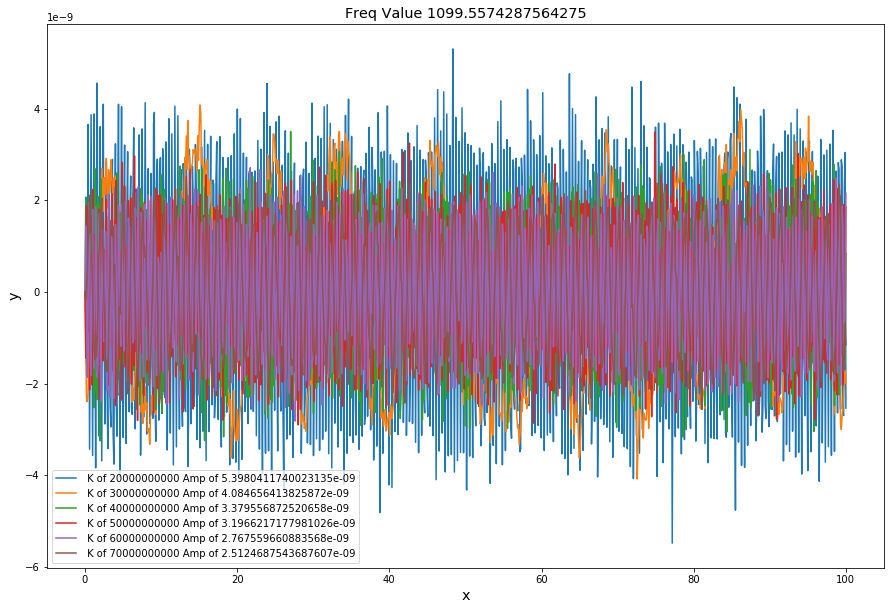

[4.83169156e-09 4.17440236e-09 3.65864545e-09 3.42567635e-09
 2.78439371e-09 2.60679698e-09]


The min amplitude is 2.606796980138623e-09 k value of 70000000000


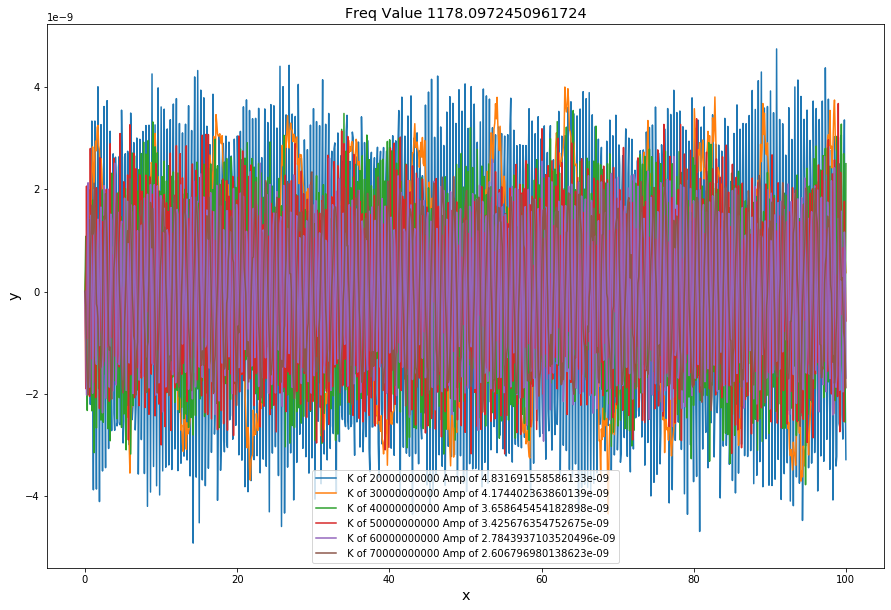

[6.22261976e-09 3.81545875e-09 3.44017488e-09 3.48979839e-09
 3.01673074e-09 2.73006068e-09]


The min amplitude is 2.7300606826909833e-09 k value of 70000000000


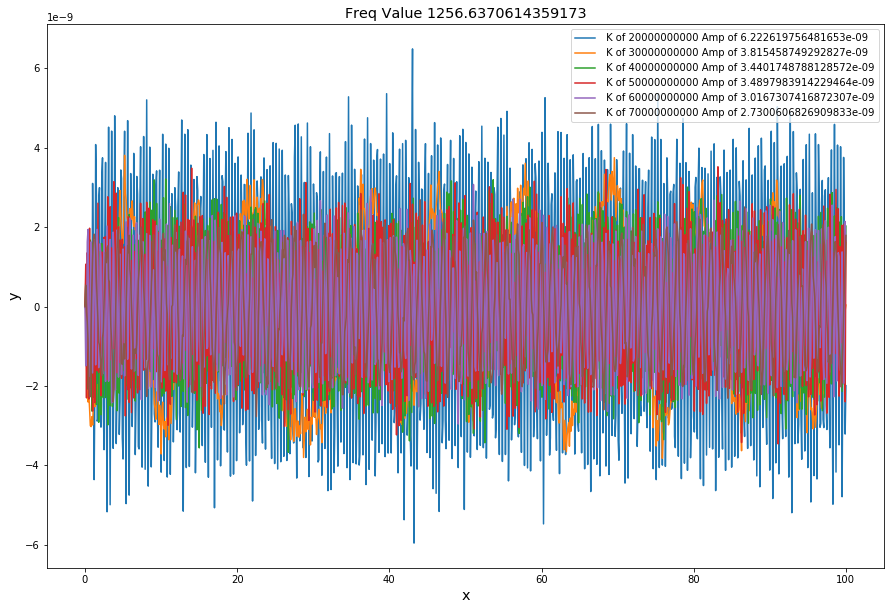

In [12]:
T_0 = 10
C = T_0/(mass*L**2)
b = np.ones(5)
for a  in range(len(b)):
    b[a]=np.pi*(300+25*a)
print(b)

amp = {}
AmpArray = np.zeros(len(k))


for i in range(len(b)):
    U0 = [0, 0]
    xs = np.linspace(0, 100, 1000)
    amp[i]={}
    
    plt.figure(figsize=(15,10))
    
    for j in range(len(k)):
        
        Us = odeint(func,U0,xs, args = (A,B[j],C,b[i]))
        ys = Us[:,0]

        amp[i][j] = (max(ys)+abs(min(ys)))/2
        AmpArray[j]= amp[i][j]
      
        #print("\n\nThe amplitude of the plot below is: "+str(amp[i][j]))
        
        PlotName = " K of "+str(k[j])+ " Amp of "+str(amp[i][j])
        
        plt.xlabel("x", fontsize = 'x-large')
        plt.ylabel("y", fontsize = 'x-large')
        plt.title("Freq Value "+str(b[i]), fontsize = 'x-large', loc = "Center")
        plt.plot(xs,ys, label= PlotName)
        plt.legend()
        
    print(AmpArray)   
    min_val = min(AmpArray)
    min_index = min(range(len(AmpArray)), key=AmpArray.__getitem__)

    print("\n\nThe min amplitude is "+ str(min_val)+" k value of "+str(k[(min_index)]))
    plt.show()
        
import math as m
#print("The amplitudes for K-values:Freq Values"+str(amp))

### T_0 = 100

[ 942.47779608 1021.01761242 1099.55742876 1178.0972451  1256.63706144]
[8.95384669e-09 6.31774962e-08 4.87415444e-09 3.97160410e-09
 3.19131300e-09 2.69702089e-09]


The min amplitude is 2.697020890825098e-09 k value of 70000000000


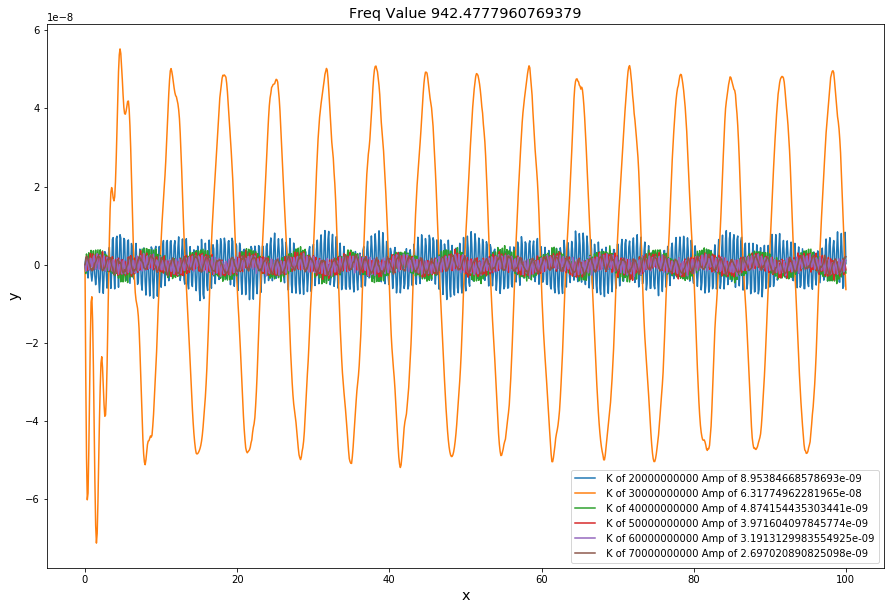

[1.06570536e-08 5.35661013e-09 4.96426358e-09 4.11444855e-09
 3.29833720e-09 2.89075547e-09]


The min amplitude is 2.890755468965174e-09 k value of 70000000000


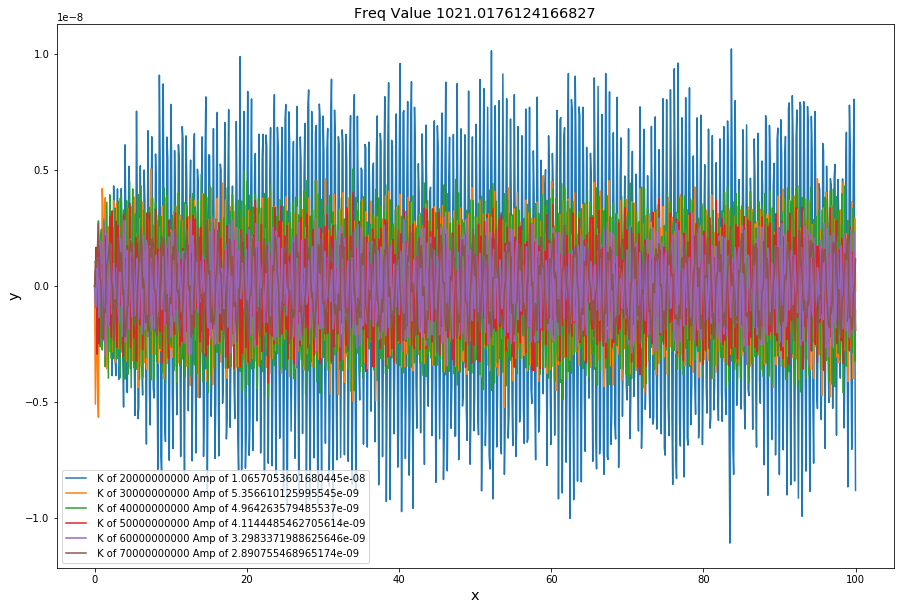

[1.09413183e-08 6.96852040e-09 1.71278096e-08 4.60637585e-09
 3.60450824e-09 2.95580233e-09]


The min amplitude is 2.9558023287342353e-09 k value of 70000000000


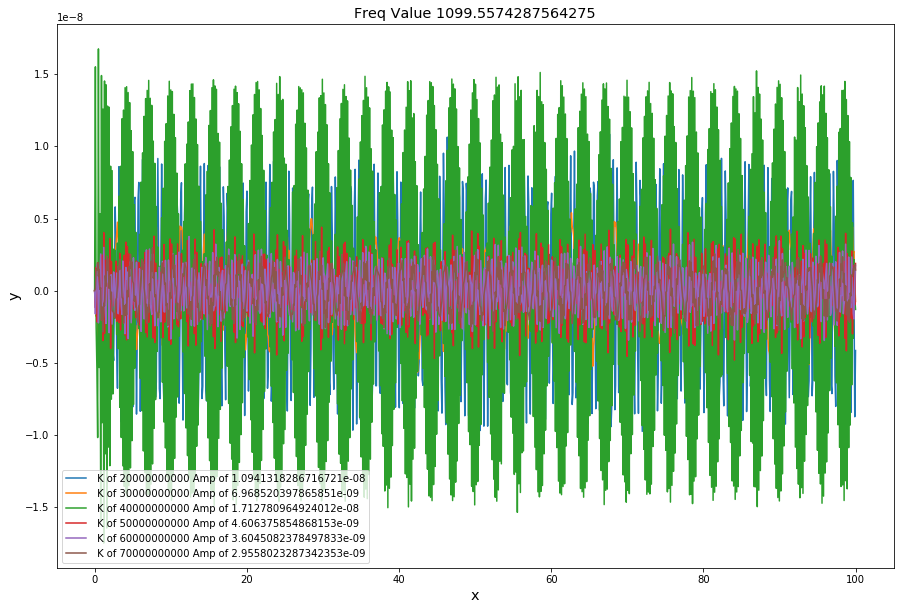

[1.23303888e-08 6.60993212e-09 4.67793960e-09 1.13374594e-08
 3.93794842e-09 3.15891204e-09]


The min amplitude is 3.1589120442891596e-09 k value of 70000000000


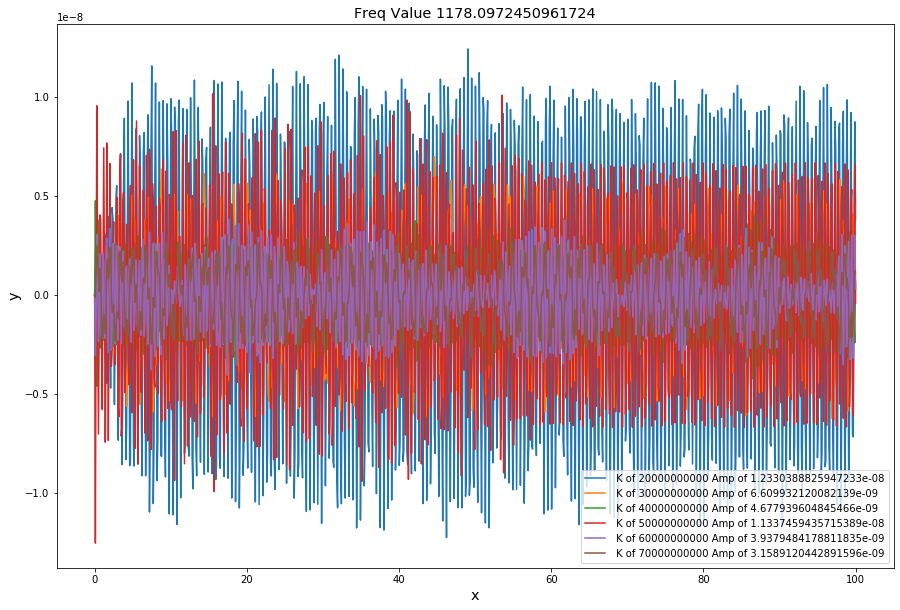

[1.50989755e-08 6.74626933e-09 5.28925443e-09 7.06955740e-09
 2.88712964e-09 3.57288785e-09]


The min amplitude is 2.8871296373108612e-09 k value of 60000000000


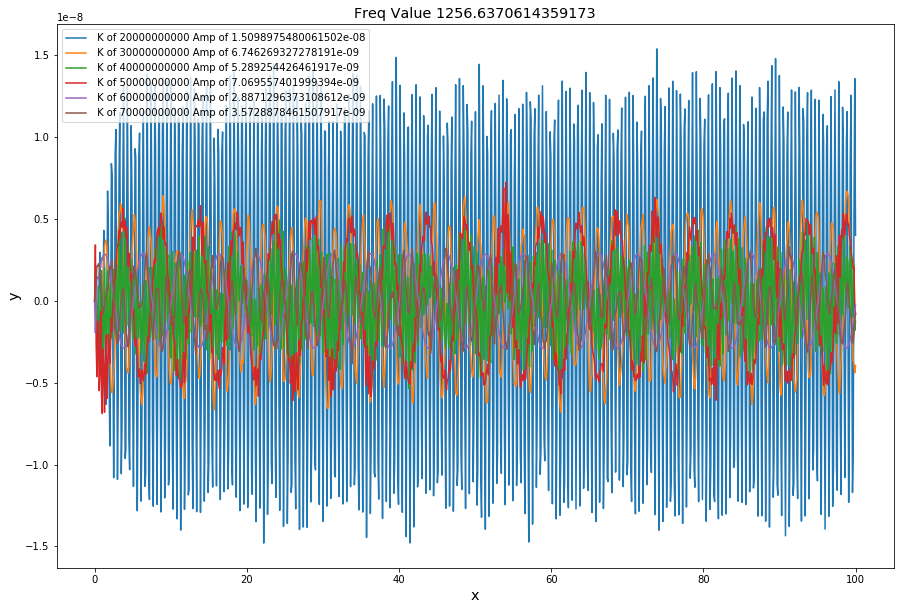

In [13]:
T_0 = 100
C = T_0/(mass*L**2)
b = np.ones(5)
for a  in range(len(b)):
    b[a]=np.pi*(300+25*a)
print(b)

amp = {}
AmpArray = np.zeros(len(k))


for i in range(len(b)):
    U0 = [0, 0]
    xs = np.linspace(0, 100, 1000)
    amp[i]={}
    
    plt.figure(figsize=(15,10))
    
    for j in range(len(k)):
        
        Us = odeint(func,U0,xs, args = (A,B[j],C,b[i]))
        ys = Us[:,0]

        amp[i][j] = (max(ys)+abs(min(ys)))/2
        AmpArray[j]= amp[i][j]
      
        #print("\n\nThe amplitude of the plot below is: "+str(amp[i][j]))
        
        PlotName = " K of "+str(k[j])+ " Amp of "+str(amp[i][j])
        
        plt.xlabel("x", fontsize = 'x-large')
        plt.ylabel("y", fontsize = 'x-large')
        plt.title("Freq Value "+str(b[i]), fontsize = 'x-large', loc = "Center")
        plt.plot(xs,ys, label= PlotName)
        plt.legend()
        
    print(AmpArray)   
    min_val = min(AmpArray)
    min_index = min(range(len(AmpArray)), key=AmpArray.__getitem__)

    print("\n\nThe min amplitude is "+ str(min_val)+" k value of "+str(k[(min_index)]))
    plt.show()
        
import math as m
#print("The amplitudes for K-values:Freq Values"+str(amp))

### T_0 = 1000

[ 942.47779608 1021.01761242 1099.55742876 1178.0972451  1256.63706144]
[2.87014514e-08 7.71923996e-07 2.14782274e-08 1.14245233e-08
 8.96722896e-09 6.94146434e-09]


The min amplitude is 6.94146433804044e-09 k value of 70000000000


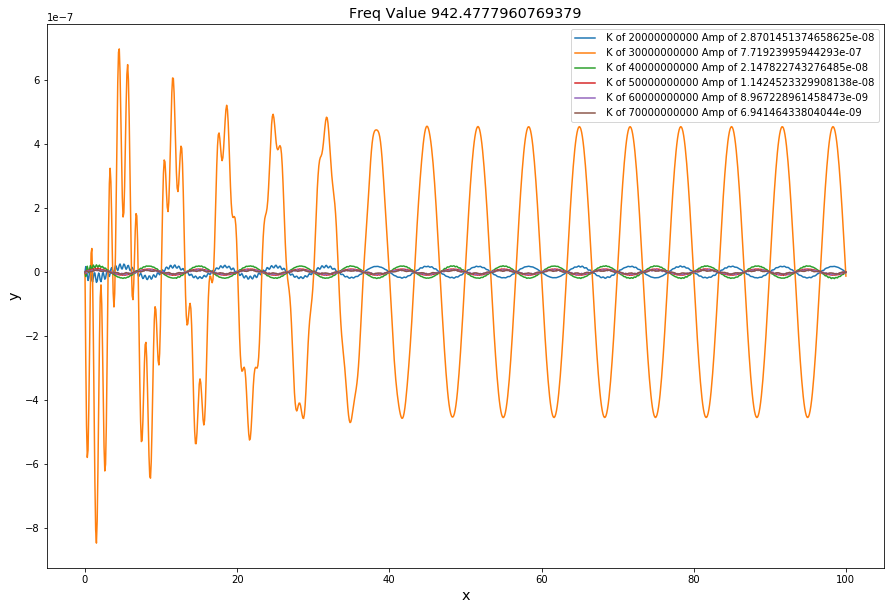

[2.10955116e-08 5.24554963e-08 5.73385689e-08 1.41237078e-08
 9.79300234e-09 7.84420125e-09]


The min amplitude is 7.844201250837784e-09 k value of 70000000000


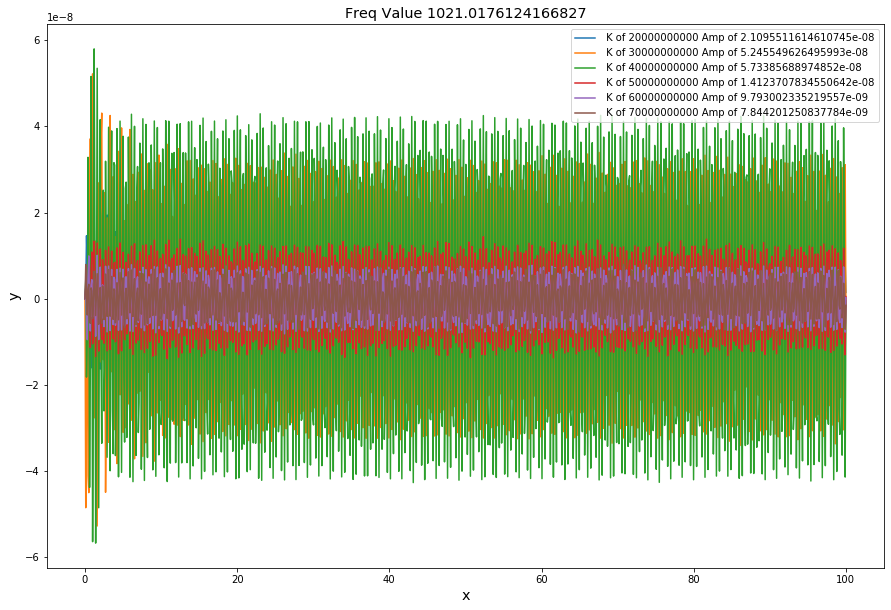

[1.58886374e-08 2.89832073e-08 2.20250645e-07 2.47136254e-08
 1.09327568e-08 8.55101341e-09]


The min amplitude is 8.551013411741322e-09 k value of 70000000000


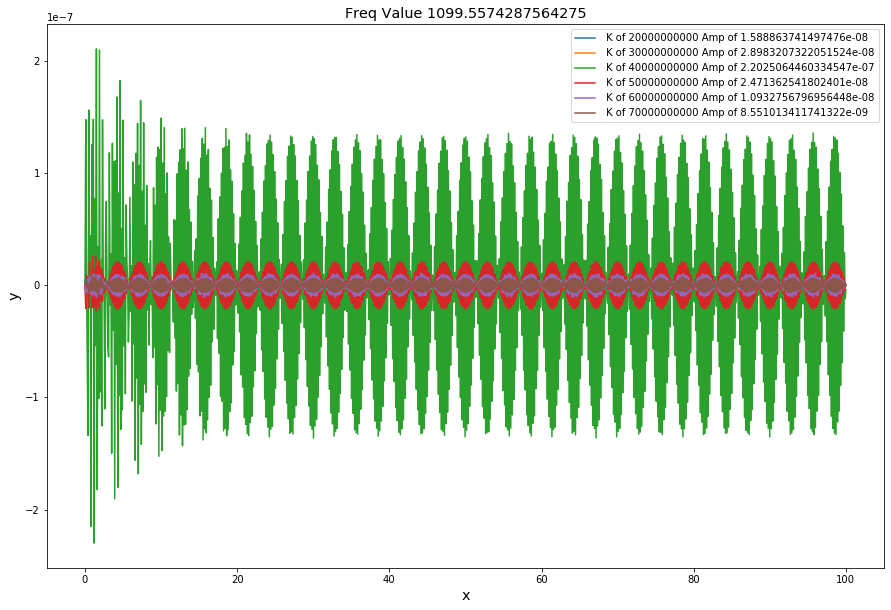

[1.37490900e-08 1.95951042e-08 4.71726267e-08 1.36122602e-07
 1.86628177e-08 8.72904945e-09]


The min amplitude is 8.72904944656116e-09 k value of 70000000000


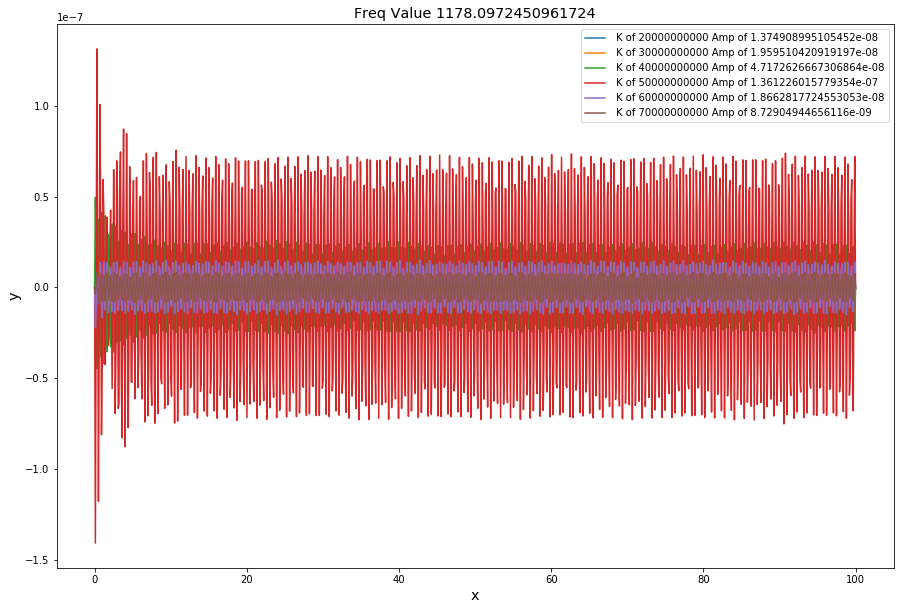

[2.14939570e-08 1.19513068e-08 1.89152454e-08 6.20165769e-08
 3.54945387e-08 1.27019927e-08]


The min amplitude is 1.1951306769677874e-08 k value of 30000000000


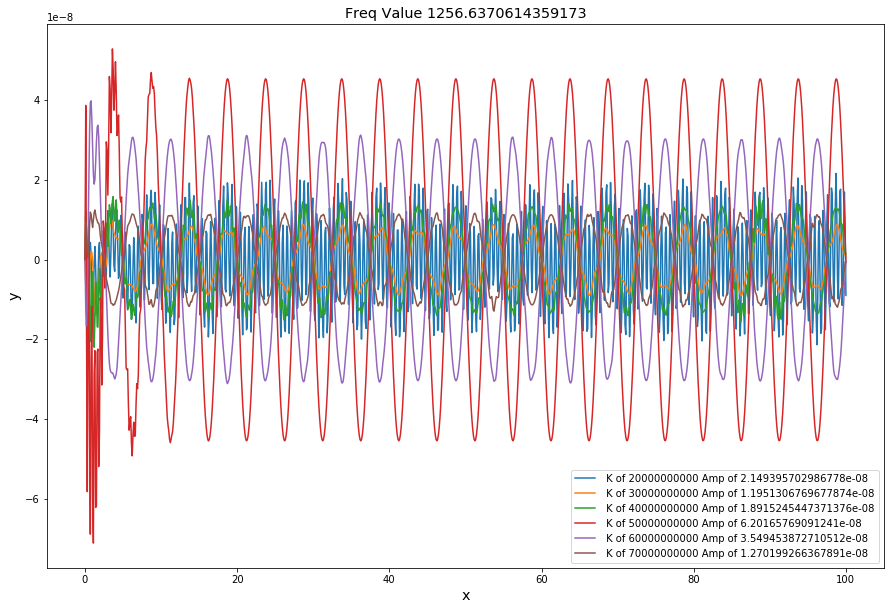

In [14]:
T_0 = 1000
C = T_0/(mass*L**2)
b = np.ones(5)
for a  in range(len(b)):
    b[a]=np.pi*(300+25*a)
print(b)

amp = {}
AmpArray = np.zeros(len(k))


for i in range(len(b)):
    U0 = [0, 0]
    xs = np.linspace(0, 100, 1000)
    amp[i]={}
    
    plt.figure(figsize=(15,10))
    
    for j in range(len(k)):
        
        Us = odeint(func,U0,xs, args = (A,B[j],C,b[i]))
        ys = Us[:,0]

        amp[i][j] = (max(ys)+abs(min(ys)))/2
        AmpArray[j]= amp[i][j]
      
        #print("\n\nThe amplitude of the plot below is: "+str(amp[i][j]))
        
        PlotName = " K of "+str(k[j])+ " Amp of "+str(amp[i][j])
        
        plt.xlabel("x", fontsize = 'x-large')
        plt.ylabel("y", fontsize = 'x-large')
        plt.title("Freq Value "+str(b[i]), fontsize = 'x-large', loc = "Center")
        plt.plot(xs,ys, label= PlotName)
        plt.legend()
        
    print(AmpArray)   
    min_val = min(AmpArray)
    min_index = min(range(len(AmpArray)), key=AmpArray.__getitem__)

    print("\n\nThe min amplitude is "+ str(min_val)+" k value of "+str(k[(min_index)]))
    plt.show()
        
import math as m
#print("The amplitudes for K-values:Freq Values"+str(amp))